# Clasificación de ciudades

#### Análisis datos Marcos, analisis factorial 


In [15]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import statsmodels.formula.api as smf # Asi usaremos la notacion de formula
import statsmodels.api as sm # asi usaremos la notacion de sklearn
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
normales = pd.read_csv("normales.csv")
#rescalado = pd.read_csv("rescalados.csv")
datos_uso_originales_porcentaje = pd.read_csv("resultados_porc_uso2.csv")
#scores = pd.read_csv("scores.csv")

In [14]:
#### Vamos a incorporar los nuevos resultados


ciudades_sin_otros = pd.read_csv(r"C:/projectos/manifolds/ciudades/datos/porcentaje/df_porcentajes_sin_otros.csv")
ciudades_filter = pd.read_csv(r"C:/projectos/manifolds/ciudades/datos/porcentaje/df_final_filter.csv")

In [60]:
datos_uso = datos_uso_originales_porcentaje

In [61]:
datos_uso

,USO,Albacete_class.shp,Alcala_class.shp,Alcobendas_class.shp,Alcorcon_class.shp,Algeciras.shp,Alicante_class.shp,Almeria_class.shp,Avila_class.shp,Badajoz_class.shp,...,Telde_class.shp,Terrasa_clas.shp,Teruel_class.shp,Toledo_class.shp,Torrejon_clas.shp,Valencia_class.shp,Valladolid_class.shp,Vigo_class.shp,Zamora_class.shp,Zaragoza_class.shp
0,COM,0.309544,1.056955,0.400440,1.212290,0.580857,0.784032,0.743810,0.191292,0.891467,...,0.734801,1.408287,0.356455,0.191295,0.250481,1.580610,0.404746,0.276154,0.750087,0.477597
1,ED_SING,4.775094,7.641072,5.448729,4.340481,1.030783,2.063975,3.990153,0.676558,1.292928,...,1.007347,2.949308,1.940661,10.147536,60.143301,3.301966,4.732781,2.100296,2.970423,4.504671
2,EQUIP_EDU,3.427693,5.264190,2.943100,7.349396,2.160662,3.138792,4.059135,27.870572,3.224984,...,1.990106,2.504338,4.166421,3.650629,1.482797,6.704864,4.599511,4.802969,4.444969,3.232540
3,EQUIP_OTR,4.188650,6.815778,5.116551,11.821959,3.990147,4.051966,6.725577,1.031044,4.030297,...,1.152777,3.605524,2.023415,3.597117,2.188335,5.694240,8.504691,4.406184,9.497844,4.556002
4,EQUIP_SANI,0.743391,1.005046,0.219057,1.882375,0.597612,0.701225,2.611155,0.512205,0.891288,...,0.186022,0.361315,1.994685,3.172389,0.414924,1.428052,1.662326,0.538630,2.365705,1.013548
5,HOS_REST,0.408664,0.463711,0.200518,0.182931,0.379388,0.426173,0.648781,0.112745,0.160289,...,0.053172,0.214717,0.597607,1.025441,0.120000,0.358837,0.406037,0.191656,0.215619,0.098948
6,IND,13.464698,15.868683,2.155552,7.639873,5.176627,8.098098,4.448190,3.366757,4.501163,...,12.380992,13.067315,17.729026,6.249912,4.275417,5.145138,17.403132,5.991808,12.414006,12.834295
7,IND_MX,6.489359,12.523890,4.377018,8.182198,2.126968,3.849916,1.341139,5.053966,1.559924,...,3.306594,4.753046,5.347080,3.127457,5.523502,4.941832,8.563992,7.295622,6.331393,12.096169
8,OCIO_ESP,0.077490,0.095006,0.018557,0.050832,0.055235,1.179941,0.043627,0.019281,0.013474,...,0.085925,0.087129,0.014175,0.009622,0.075831,0.234012,0.177049,0.167403,0.069630,0.093010
9,OFI,0.384967,1.287052,2.453760,0.217896,0.178552,0.284920,0.514804,0.448797,0.285702,...,0.107312,0.289913,0.069542,0.392849,0.187915,0.555414,0.335431,0.260198,0.133918,0.172093


In [62]:
clases_agregadas = pd.read_csv("clases_agregadas.csv")

In [63]:
clases_agregadas

,USO,USO_AG
0,COM,COM
1,ED_SING,ED_SING
2,EQUIP_EDU,EQUIP
3,EQUIP_OTR,EQUIP
4,EQUIP_SANI,EQUIP
5,HOS_REST,OCIO
6,IND,IND
7,IND_MX,IND
8,OCIO_ESP,OCIO
9,OFI,OFI


In [65]:
datos_uso_ag = pd.merge(datos_uso, clases_agregadas, on ='USO', how = "left")
#datos_uso.merge(clases_agregadas, on = 'USO', how = 'left') ## Esto es una forma de hacer un merge sin usar pd
datos_uso_ag

,USO,Albacete_class.shp,Alcala_class.shp,Alcobendas_class.shp,Alcorcon_class.shp,Algeciras.shp,Alicante_class.shp,Almeria_class.shp,Avila_class.shp,Badajoz_class.shp,...,Terrasa_clas.shp,Teruel_class.shp,Toledo_class.shp,Torrejon_clas.shp,Valencia_class.shp,Valladolid_class.shp,Vigo_class.shp,Zamora_class.shp,Zaragoza_class.shp,USO_AG
0,COM,0.309544,1.056955,0.400440,1.212290,0.580857,0.784032,0.743810,0.191292,0.891467,...,1.408287,0.356455,0.191295,0.250481,1.580610,0.404746,0.276154,0.750087,0.477597,COM
1,ED_SING,4.775094,7.641072,5.448729,4.340481,1.030783,2.063975,3.990153,0.676558,1.292928,...,2.949308,1.940661,10.147536,60.143301,3.301966,4.732781,2.100296,2.970423,4.504671,ED_SING
2,EQUIP_EDU,3.427693,5.264190,2.943100,7.349396,2.160662,3.138792,4.059135,27.870572,3.224984,...,2.504338,4.166421,3.650629,1.482797,6.704864,4.599511,4.802969,4.444969,3.232540,EQUIP
3,EQUIP_OTR,4.188650,6.815778,5.116551,11.821959,3.990147,4.051966,6.725577,1.031044,4.030297,...,3.605524,2.023415,3.597117,2.188335,5.694240,8.504691,4.406184,9.497844,4.556002,EQUIP
4,EQUIP_SANI,0.743391,1.005046,0.219057,1.882375,0.597612,0.701225,2.611155,0.512205,0.891288,...,0.361315,1.994685,3.172389,0.414924,1.428052,1.662326,0.538630,2.365705,1.013548,EQUIP
5,HOS_REST,0.408664,0.463711,0.200518,0.182931,0.379388,0.426173,0.648781,0.112745,0.160289,...,0.214717,0.597607,1.025441,0.120000,0.358837,0.406037,0.191656,0.215619,0.098948,OCIO
6,IND,13.464698,15.868683,2.155552,7.639873,5.176627,8.098098,4.448190,3.366757,4.501163,...,13.067315,17.729026,6.249912,4.275417,5.145138,17.403132,5.991808,12.414006,12.834295,IND
7,IND_MX,6.489359,12.523890,4.377018,8.182198,2.126968,3.849916,1.341139,5.053966,1.559924,...,4.753046,5.347080,3.127457,5.523502,4.941832,8.563992,7.295622,6.331393,12.096169,IND
8,OCIO_ESP,0.077490,0.095006,0.018557,0.050832,0.055235,1.179941,0.043627,0.019281,0.013474,...,0.087129,0.014175,0.009622,0.075831,0.234012,0.177049,0.167403,0.069630,0.093010,OCIO
9,OFI,0.384967,1.287052,2.453760,0.217896,0.178552,0.284920,0.514804,0.448797,0.285702,...,0.289913,0.069542,0.392849,0.187915,0.555414,0.335431,0.260198,0.133918,0.172093,OFI


In [32]:
datos_uso_ag.shape

(15, 76)

In [66]:
datos_uso_ag_group = datos_uso_ag.iloc[:,1:77].groupby(by ='USO_AG', axis = 0).sum()
datos_uso_ag_group = datos_uso_ag_group.reset_index()

In [73]:
datos_uso_ag_group

,USO_AG,Albacete_class.shp,Alcala_class.shp,Alcobendas_class.shp,Alcorcon_class.shp,Algeciras.shp,Alicante_class.shp,Almeria_class.shp,Avila_class.shp,Badajoz_class.shp,...,Telde_class.shp,Terrasa_clas.shp,Teruel_class.shp,Toledo_class.shp,Torrejon_clas.shp,Valencia_class.shp,Valladolid_class.shp,Vigo_class.shp,Zamora_class.shp,Zaragoza_class.shp
0,COM,0.309544,1.056955,0.400440,1.212290,0.580857,0.784032,0.743810,0.191292,0.891467,...,0.734801,1.408287,0.356455,0.191295,0.250481,1.580610,0.404746,0.276154,0.750087,0.477597
1,ED_SING,4.775094,7.641072,5.448729,4.340481,1.030783,2.063975,3.990153,0.676558,1.292928,...,1.007347,2.949308,1.940661,10.147536,60.143301,3.301966,4.732781,2.100296,2.970423,4.504671
2,EQUIP,8.359734,13.085014,8.278708,21.053730,6.748421,7.891983,13.395867,29.413821,8.146569,...,3.328905,6.471177,8.184521,10.420136,4.086056,13.827157,14.766528,9.747783,16.308518,8.802090
3,IND,19.954056,28.392573,6.532570,15.822071,7.303595,11.948014,5.789329,8.420723,6.061086,...,15.687586,17.820361,23.076106,9.377369,9.798919,10.086970,25.967124,13.287430,18.745399,24.930464
4,OCIO,0.486154,0.558717,0.219075,0.233763,0.434623,1.606115,0.692408,0.132025,0.173763,...,0.139097,0.301847,0.611782,1.035063,0.195830,0.592848,0.583085,0.359059,0.285250,0.191959
5,OFI,0.384967,1.287052,2.453760,0.217896,0.178552,0.284920,0.514804,0.448797,0.285702,...,0.107312,0.289913,0.069542,0.392849,0.187915,0.555414,0.335431,0.260198,0.133918,0.172093
6,RES_PLU,11.678268,9.497315,7.263672,15.072889,5.397854,17.210397,15.721599,8.214648,7.408653,...,7.380544,15.559752,8.195785,5.405144,6.341915,30.617655,14.565058,7.613281,14.450021,14.759575
7,RES_UNI,23.608630,6.346319,20.764044,5.279800,28.609229,25.902312,21.244800,15.112515,45.585462,...,17.509745,20.819831,15.786484,23.896702,2.472444,5.876546,11.628776,30.742750,13.501339,9.015557
8,SIN_EDIF,30.443552,32.134984,48.639002,36.767081,49.716086,32.308252,37.907229,37.389621,30.154369,...,54.104662,34.379524,41.778664,39.133906,16.523138,33.560834,27.016471,35.613050,32.855046,37.145995


In [67]:
datos_uso_ag_long = datos_uso_ag_group.melt(id_vars = "USO_AG")
datos_uso_ag_long

,USO_AG,variable,value
0,COM,Albacete_class.shp,0.309544
1,ED_SING,Albacete_class.shp,4.775094
2,EQUIP,Albacete_class.shp,8.359734
3,IND,Albacete_class.shp,19.954056
4,OCIO,Albacete_class.shp,0.486154
...,...,...,...
661,OCIO,Zaragoza_class.shp,0.191959
662,OFI,Zaragoza_class.shp,0.172093
663,RES_PLU,Zaragoza_class.shp,14.759575
664,RES_UNI,Zaragoza_class.shp,9.015557


In [68]:
datos_uso_ag_wide = datos_uso_ag_long.pivot(columns = "USO_AG", values = 'value', index = 'variable')

In [69]:
datos_uso_ag_wide_ind = datos_uso_ag_wide.reset_index()


In [70]:
datos_uso_ag_wide_ind

USO_AG,variable,COM,ED_SING,EQUIP,IND,OCIO,OFI,RES_PLU,RES_UNI,SIN_EDIF
0,Albacete_class.shp,0.309544,4.775094,8.359734,19.954056,0.486154,0.384967,11.678268,23.608630,30.443552
1,Alcala_class.shp,1.056955,7.641072,13.085014,28.392573,0.558717,1.287052,9.497315,6.346319,32.134984
2,Alcobendas_class.shp,0.400440,5.448729,8.278708,6.532570,0.219075,2.453760,7.263672,20.764044,48.639002
3,Alcorcon_class.shp,1.212290,4.340481,21.053730,15.822071,0.233763,0.217896,15.072889,5.279800,36.767081
4,Algeciras.shp,0.580857,1.030783,6.748421,7.303595,0.434623,0.178552,5.397854,28.609229,49.716086
...,...,...,...,...,...,...,...,...,...,...
69,Valladolid_class.shp,0.404746,4.732781,14.766528,25.967124,0.583085,0.335431,14.565058,11.628776,27.016471
70,Vigo_class.shp,0.276154,2.100296,9.747783,13.287430,0.359059,0.260198,7.613281,30.742750,35.613050
71,Zamora_class.shp,0.750087,2.970423,16.308518,18.745399,0.285250,0.133918,14.450021,13.501339,32.855046
72,Zaragoza_class.shp,0.477597,4.504671,8.802090,24.930464,0.191959,0.172093,14.759575,9.015557,37.145995


In [71]:
datos_uso_ag_wide_ind.to_csv('datos_uso_porcentaje_ag.csv')

In [15]:
datos_long = datos_uso_ag.melt(id_vars = "USO")
datos_long = datos_uso_ag.melt(id_vars = "USO")

In [6]:
usos_wide = datos_long.pivot(columns = "USO", values = "value", index = "variable")

In [7]:
usos_wide

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
variable,,,,,,,,,,,,,,,
Albacete_class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
Alcala_class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
Alcobendas_class.shp,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
Alcorcon_class.shp,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Valladolid_class.shp,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471
Vigo_class.shp,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050
Zamora_class.shp,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046


In [66]:
## https://towardsdatascience.com/wide-to-long-data-how-and-when-to-use-pandas-melt-stack-and-wide-to-long-7c1e0f462a98
## https://www.statology.org/pandas-rename-columns/

In [67]:
## Los nombres han quedado en el indice.
## Vamos a crear una nueva columna a partir de los indices

In [123]:
#usos_wide["Ciudades"] = usos_wide.index

# Aquí vamos a insertar una columna de una ciudad a partir de los valores de los indices.

In [8]:
usos_wide.insert(0,"Ciudades", usos_wide.index)

In [9]:
usos_wide.head()

USO,Ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
variable,,,,,,,,,,,,,,,,
Albacete_class.shp,Albacete_class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
Alcala_class.shp,Alcala_class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
Alcobendas_class.shp,Alcobendas_class.shp,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
Alcorcon_class.shp,Alcorcon_class.shp,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
Algeciras.shp,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086


In [11]:
usos_wide[['ciudades','extension']] = usos_wide['Ciudades'].str.split('_', n = 1, expand=True)

In [12]:
usos_wide.columns.str.replace(" ","")
usos_wide.head(2)

USO,Ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,ciudades,extension
variable,,,,,,,,,,,,,,,,,,
Albacete_class.shp,Albacete_class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552,Albacete,class.shp
Alcala_class.shp,Alcala_class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984,Alcala,class.shp


In [84]:
usos_wide.columns

Index(['Ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF', 'ciudades', 'extension'],
      dtype='object', name='USO')

In [85]:
usos_wide = usos_wide.loc[:,['ciudades','COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']]

In [28]:
usos_wide.describe().T

,count,mean,std,min,25%,50%,75%,max
USO,,,,,,,,
COM,74.0,0.785606,0.589349,0.143351,0.417711,0.694658,0.895089,4.365902
ED_SING,74.0,5.133447,7.259724,0.119235,2.106054,3.680738,5.557528,60.143301
EQUIP_EDU,74.0,4.635776,3.355345,0.624536,3.103728,3.933597,5.412323,27.870572
EQUIP_OTR,74.0,5.583626,2.571123,1.031044,3.973943,5.050962,6.969122,12.866715
EQUIP_SANI,74.0,1.474843,1.356014,0.186022,0.701136,1.169671,1.848629,9.668516
HOS_REST,74.0,0.448226,0.537275,0.053172,0.156799,0.302349,0.498370,3.911256
IND,74.0,9.305635,4.714537,2.155552,5.670040,8.073137,12.400219,22.487593
IND_MX,74.0,5.922709,3.670640,0.382423,3.196919,4.989522,7.227292,16.946118
OCIO_ESP,74.0,0.150069,0.202193,0.009622,0.046020,0.087099,0.144089,1.179941


In [29]:
usos_wide.shape

(74, 16)

In [30]:
usos_wide.to_csv("usos_wide.csv")

In [31]:
import numpy as np

In [80]:
##https://stackoverflow.com/questions/10062954/valueerror-the-truth-value-of-an-array-with-more-than-one-element-is-ambiguous

In [81]:
# data_mean, data_std = np.mean(np.array(usos_wide.iloc[:,2:18])), np.std(np.array(usos_wide.iloc[:,2:18])) ## Este comportamiento ya no funcionará en el futuro.


 https://machinelearningmastery.com/how-to-use-statistics-to-identify-outliers-in-data/

In [32]:
## Iterar por columnas
columns = list(usos_wide.iloc[:,1:17])
print(columns)

['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']


In [ ]:
### Hemos realizado el analisis de los outliers

In [33]:
atipicos = pd.read_csv('atipicos_IQR.csv')

atipicos.head(2)

,Unnamed: 0,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,0,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
1,1,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico


In [34]:
atipicos = atipicos.iloc[:,1:19]

In [35]:
atipicos.apply(lambda x: x.value_counts())

,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
atipico,3,5,5,2,4,6,NaN,4,8,8,4,6,2,6,1
tipico,71,69,69,72,70,68,74.0,70,66,66,70,68,72,68,73


In [36]:
atipicos = atipicos.reset_index()

In [37]:
atipicos.head(2)

,index,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,0,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
1,1,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico


In [38]:
usos_wide['index'] = range(74)

In [43]:
# usos_wide = usos_wide.drop('Index', axis = 1) Si acabo de crear este indice porque lo voy a eliminar tan rapido

In [26]:
usos_wide.index

Index(['Albacete_class.shp', 'Alcala_class.shp', 'Alcobendas_class.shp',
       'Alcorcon_class.shp', 'Algeciras.shp', 'Alicante_class.shp',
       'Almeria_class.shp', 'Avila_class.shp', 'Badajoz_class.shp',
       'Badalona_class.shp', 'Barcelona_class.shp', 'Burgos_class.shp',
       'Caceres_class.shp', 'Cadiz_class.shp', 'Cartagena_class.shp',
       'Castello_de_la_Plana_class.shp', 'Ceuta_class.shp',
       'Ciudad_Real_class.shp', 'Cordoba_class.shp', 'Corunia_class.shp',
       'Cuenca_class.shp', 'Elche_class.shp', 'Fuenlabrada_class.shp',
       'Getafe.shp', 'Gijon_class.shp', 'Girona_class.shp',
       'Granada_class.shp', 'Guadalajara_class.shp',
       'Hospitalet_de_Llobregat_class.shp', 'Huelva_class.shp',
       'Huesca_class.shp', 'Jaen_class.shp', 'Jerez_de_la_Frontera_class.shp',
       'Las_Palmas_Gran_Canaria_class.shp', 'Leganes.shp', 'Leon_class.shp',
       'Lleida_class.shp', 'Logronio_class.shp', 'Lugo_class.shp',
       'Madrid_class.shp', 'Malaga_class.shp

In [39]:
atipicos.iloc[:,1:15].apply(lambda x: x.value_counts())

,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX
atipico,3,5,5,2,4,6,NaN,4,8,8,4,6,2,6
tipico,71,69,69,72,70,68,74.0,70,66,66,70,68,72,68


In [40]:
usos_wide = pd.merge(usos_wide, atipicos, on = "index", suffixes = ["","_iqr"])

In [41]:
usos_wide

,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,...,HOS_REST_iqr,IND_iqr,IND_MX_iqr,OCIO_ESP_iqr,OFI_iqr,RES_PLU_iqr,RES_PLU_MX_iqr,RES_UNI_iqr,RES_UNI_MX_iqr,SIN_EDIF_iqr
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,...,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico
2,Alcobendas,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,...,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico
3,Alcorcon,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
4,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
70,Vigo,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico
71,Zamora,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
72,Zaragoza,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico


In [42]:
usos_wide_drop = usos_wide # Hago esto para poder seguir utilizando el codigo que esta abajo

In [43]:
usos_wide_drop.columns

Index(['ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF', 'index', 'COM_iqr', 'ED_SING_iqr',
       'EQUIP_EDU_iqr', 'EQUIP_OTR_iqr', 'EQUIP_SANI_iqr', 'HOS_REST_iqr',
       'IND_iqr', 'IND_MX_iqr', 'OCIO_ESP_iqr', 'OFI_iqr', 'RES_PLU_iqr',
       'RES_PLU_MX_iqr', 'RES_UNI_iqr', 'RES_UNI_MX_iqr', 'SIN_EDIF_iqr'],
      dtype='object')

In [32]:
usos_wide_drop

,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,...,HOS_REST_iqr,IND_iqr,IND_MX_iqr,OCIO_ESP_iqr,OFI_iqr,RES_PLU_iqr,RES_PLU_MX_iqr,RES_UNI_iqr,RES_UNI_MX_iqr,SIN_EDIF_iqr
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,...,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico
2,Alcobendas,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,...,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico
3,Alcorcon,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
4,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
70,Vigo,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico
71,Zamora,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico
72,Zaragoza,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,...,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico


In [44]:
# How to change the columns order https://stackoverflow.com/questions/11067027/sorting-columns-in-pandas-dataframe-based-on-column-name
usos_wide_drop = usos_wide_drop.reindex(sorted(usos_wide_drop.columns), axis=1)

In [45]:
usos_wide_drop.columns

Index(['COM', 'COM_iqr', 'ED_SING', 'ED_SING_iqr', 'EQUIP_EDU',
       'EQUIP_EDU_iqr', 'EQUIP_OTR', 'EQUIP_OTR_iqr', 'EQUIP_SANI',
       'EQUIP_SANI_iqr', 'HOS_REST', 'HOS_REST_iqr', 'IND', 'IND_MX',
       'IND_MX_iqr', 'IND_iqr', 'OCIO_ESP', 'OCIO_ESP_iqr', 'OFI', 'OFI_iqr',
       'RES_PLU', 'RES_PLU_MX', 'RES_PLU_MX_iqr', 'RES_PLU_iqr', 'RES_UNI',
       'RES_UNI_MX', 'RES_UNI_MX_iqr', 'RES_UNI_iqr', 'SIN_EDIF',
       'SIN_EDIF_iqr', 'ciudades', 'index'],
      dtype='object')

In [46]:
usos_list_col = ['ciudades','COM', 'COM_iqr', 'ED_SING', 'ED_SING_iqr', 'EQUIP_EDU',
       'EQUIP_EDU_iqr', 'EQUIP_OTR', 'EQUIP_OTR_iqr', 'EQUIP_SANI',
       'EQUIP_SANI_iqr', 'HOS_REST', 'HOS_REST_iqr', 'IND', 'IND_MX',
       'IND_MX_iqr', 'IND_iqr', 'OCIO_ESP', 'OCIO_ESP_iqr', 'OFI', 'OFI_iqr',
       'RES_PLU', 'RES_PLU_MX', 'RES_PLU_MX_iqr', 'RES_PLU_iqr', 'RES_UNI',
       'RES_UNI_MX', 'RES_UNI_MX_iqr', 'RES_UNI_iqr', 'SIN_EDIF',
       'SIN_EDIF_iqr']

In [47]:
usos_wide_drop = usos_wide_drop[usos_list_col]




In [48]:
usos_wide_drop.to_csv('uso_wide_iqr.csv')

In [64]:
#from itables import init_notebook_mode  # Hay que instalar esta  libreria
#init_notebook_mode(all_interactive=True)

In [49]:
usos_wide_iqr = usos_wide_drop

## Resultado final: Obtenemos el data.frame considerando 

In [50]:
usos_wide_iqr

,ciudades,COM,COM_iqr,ED_SING,ED_SING_iqr,EQUIP_EDU,EQUIP_EDU_iqr,EQUIP_OTR,EQUIP_OTR_iqr,EQUIP_SANI,...,RES_PLU,RES_PLU_MX,RES_PLU_MX_iqr,RES_PLU_iqr,RES_UNI,RES_UNI_MX,RES_UNI_MX_iqr,RES_UNI_iqr,SIN_EDIF,SIN_EDIF_iqr
0,Albacete,0.309544,tipico,4.775094,tipico,3.427693,tipico,4.188650,tipico,0.743391,...,6.551059,5.127209,tipico,tipico,22.820463,0.788167,tipico,tipico,30.443552,tipico
1,Alcala,1.056955,tipico,7.641072,tipico,5.264190,tipico,6.815778,tipico,1.005046,...,6.621817,2.875498,tipico,tipico,6.032543,0.313776,tipico,tipico,32.134984,tipico
2,Alcobendas,0.400440,tipico,5.448729,tipico,2.943100,tipico,5.116551,tipico,0.219057,...,5.923401,1.340272,tipico,tipico,19.175420,1.588624,tipico,tipico,48.639002,tipico
3,Alcorcon,1.212290,tipico,4.340481,tipico,7.349396,tipico,11.821959,atipico,1.882375,...,10.475900,4.596989,tipico,tipico,5.148168,0.131632,tipico,tipico,36.767081,tipico
4,Algeciras.shp,0.580857,tipico,1.030783,tipico,2.160662,tipico,3.990147,tipico,0.597612,...,3.154989,2.242866,tipico,tipico,25.815777,2.793453,tipico,tipico,49.716086,tipico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,0.404746,tipico,4.732781,tipico,4.599511,tipico,8.504691,tipico,1.662326,...,8.868738,5.696320,tipico,tipico,10.713216,0.915560,tipico,tipico,27.016471,tipico
70,Vigo,0.276154,tipico,2.100296,tipico,4.802969,tipico,4.406184,tipico,0.538630,...,0.791854,6.821427,tipico,tipico,5.153568,25.589182,atipico,tipico,35.613050,tipico
71,Zamora,0.750087,tipico,2.970423,tipico,4.444969,tipico,9.497844,tipico,2.365705,...,9.378723,5.071298,tipico,tipico,11.797034,1.704305,tipico,tipico,32.855046,tipico
72,Zaragoza,0.477597,tipico,4.504671,tipico,3.232540,tipico,4.556002,tipico,1.013548,...,7.585931,7.173644,tipico,tipico,8.182778,0.832779,tipico,tipico,37.145995,tipico


In [51]:
usos_wide_iqr.query('COM_iqr == "atipico"') 

,ciudades,COM,COM_iqr,ED_SING,ED_SING_iqr,EQUIP_EDU,EQUIP_EDU_iqr,EQUIP_OTR,EQUIP_OTR_iqr,EQUIP_SANI,...,RES_PLU,RES_PLU_MX,RES_PLU_MX_iqr,RES_PLU_iqr,RES_UNI,RES_UNI_MX,RES_UNI_MX_iqr,RES_UNI_iqr,SIN_EDIF,SIN_EDIF_iqr
21,Elche,1.632731,atipico,1.129543,tipico,4.992758,tipico,2.941832,tipico,0.584334,...,5.433238,5.892479,tipico,tipico,29.352823,4.719911,atipico,tipico,28.529129,tipico
40,Malaga,4.365902,atipico,0.119235,tipico,2.486705,tipico,12.866715,atipico,1.840434,...,8.997475,5.195559,tipico,tipico,25.534630,1.266928,tipico,tipico,26.048746,tipico
56,Santa,2.163695,atipico,1.932546,tipico,5.921874,tipico,7.091691,tipico,9.668516,...,21.467627,16.800761,atipico,atipico,14.135661,1.628258,tipico,tipico,11.327238,atipico


1.- Seria interesante poder tener la suma por ciudad. Numero de veces que cada ciudad es un valor atipico para cada una de las variables.

2.-  No es tan facil, probablemente necesitamos dar vuelta la tabla. pasar de wide a long y dejar las ciudades nuevamente como variable.

https://sparkbyexamples.com/pandas/pandas-groupby-sum-examples/


In [52]:
atipicos['ciudades'] = usos_wide_iqr.ciudades

In [53]:
atipicos

,index,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,ciudades
0,0,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Albacete
1,1,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico,Alcala
2,2,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico,Alcobendas
3,3,tipico,tipico,tipico,atipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Alcorcon
4,4,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Algeciras.shp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,69,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Valladolid
70,70,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,atipico,tipico,Vigo
71,71,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Zamora
72,72,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,tipico,Zaragoza


En el proximo grafico como poder colocar en hover el nombre de la ciudad.

https://stackoverflow.com/questions/59057881/python-plotly-how-to-customize-hover-template-on-with-what-information-to-show

In [54]:
import seaborn as sns

In [162]:
# Este codigo lo he sacado desde internet el articulo de la identificacion de outliers. Funcionaba en visual studio code, pero aqui no
#ax= sns.histplot(usos_wide_iqr.COM, hist=True, hist_kws={"edgecolor": 'w', "linewidth": 3}, kde_kws={"linewidth": 3})

In [56]:
usos_wide.columns

Index(['ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF', 'index', 'COM_iqr', 'ED_SING_iqr',
       'EQUIP_EDU_iqr', 'EQUIP_OTR_iqr', 'EQUIP_SANI_iqr', 'HOS_REST_iqr',
       'IND_iqr', 'IND_MX_iqr', 'OCIO_ESP_iqr', 'OFI_iqr', 'RES_PLU_iqr',
       'RES_PLU_MX_iqr', 'RES_UNI_iqr', 'RES_UNI_MX_iqr', 'SIN_EDIF_iqr'],
      dtype='object')

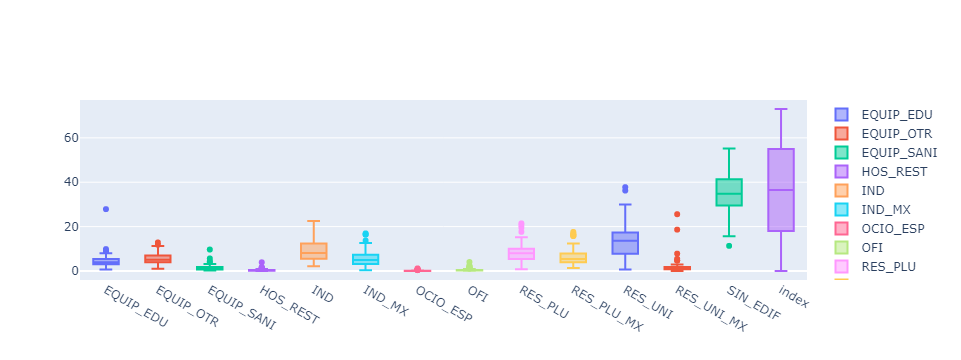

In [57]:
import plotly.graph_objects as go

datos = usos_wide.iloc[:,3:18]

fig = go.Figure()

for col in datos:
  fig.add_trace(go.Box(y=datos[col].values, name=datos[col].name))
   
  
fig.show()

In [47]:
datos

,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,index,COM_iqr
0,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552,0,tipico
1,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984,1,tipico
2,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002,2,tipico
3,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081,3,tipico
4,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086,4,tipico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471,69,tipico
70,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050,70,tipico
71,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046,71,tipico
72,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,0.172093,7.585931,7.173644,8.182778,0.832779,37.145995,72,tipico


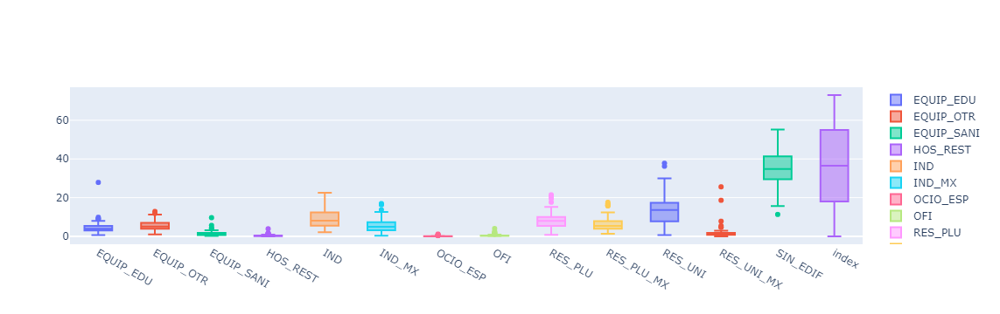

In [48]:
import plotly.graph_objects as go

datos = usos_wide.iloc[:,3:18]

fig = go.Figure()

for col in datos:
  fig.add_trace(go.Box(y=datos[col].values, name=datos[col].name))
   
  
fig.show()

In [88]:
usos_wide = usos_wide[['ciudades','COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']]

In [89]:
usos_wide

USO,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
variable,,,,,,,,,,,,,,,,
Albacete_class.shp,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
Alcala_class.shp,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
Alcobendas_class.shp,Alcobendas,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
Alcorcon_class.shp,Alcorcon,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
Algeciras.shp,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Valladolid_class.shp,Valladolid,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471
Vigo_class.shp,Vigo,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050
Zamora_class.shp,Zamora,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046


In [90]:
# Vamos a escalar usando la std

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [92]:
usos_wide.iloc[:,1:18]

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
variable,,,,,,,,,,,,,,,
Albacete_class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
Alcala_class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
Alcobendas_class.shp,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
Alcorcon_class.shp,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Valladolid_class.shp,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471
Vigo_class.shp,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050
Zamora_class.shp,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046


In [107]:
st_scaler = StandardScaler()
mm_scaler = MinMaxScaler()

st_scaler.fit(usos_wide.iloc[:,1:18])
mm_scaler.fit(usos_wide.iloc[:,1:18])



MinMaxScaler()

In [110]:
st_usos_wide = st_scaler.transform(usos_wide.iloc[:,1:18])
mm_usos_wide = mm_scaler.transform(usos_wide.iloc[:,1:18])

In [111]:
df_st_usos_wide = pd.DataFrame(usos_wide.iloc[:,1:18],
           columns = usos_wide.iloc[:,1:18].columns)

In [112]:
df_mm_usos_wide = pd.DataFrame(usos_wide.iloc[:,1:18],
           columns = usos_wide.iloc[:,1:18].columns)

In [113]:
usos_wide = usos_wide.reset_index(drop=True)

In [114]:
df_mm_usos_wide

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
2,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
3,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
4,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471
70,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050
71,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046
72,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,0.172093,7.585931,7.173644,8.182778,0.832779,37.145995


In [115]:
df_mm_usos_wide.insert(0, "ciudades", usos_wide.ciudades, allow_duplicates=True)

In [116]:
df_st_usos_wide.insert(0, "ciudades", usos_wide.ciudades)

In [117]:
df_st_usos_wide.head(2)

USO,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984


In [118]:
df_mm_usos_wide.head(2)

USO,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984


In [119]:
df_mm_usos_wide.head()

USO,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
2,Alcobendas,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
3,Alcorcon,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
4,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086


In [120]:
df_mm_usos_wide.shape

(74, 16)

In [121]:
df_mm_usos_wide.to_csv('ciudades_mm.csv')
df_st_usos_wide.to_csv('ciudades_st.csv')

In [36]:
df_st_usos_wide.iloc[:,0:17]

USO,ciudades,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,Albacete,-0.049699,-0.362505,-0.546259,-0.543095,-0.074136,0.888200,0.155427,-0.361409,-0.200697,-0.450751,-0.340093,1.112127,-0.360938,-0.529560
1,Alcala,0.347774,0.188566,0.482498,-0.348819,0.029019,1.401590,1.810649,-0.274188,1.262848,-0.433622,-0.928554,-0.960115,-0.492499,-0.345475
2,Alcobendas,0.043725,-0.507915,-0.182902,-0.932408,-0.464191,-1.526956,-0.423970,-0.654867,3.155719,-0.602688,-1.329770,0.662196,-0.138949,1.450724
3,Alcorcon,-0.109974,0.814266,2.442868,0.302588,-0.497148,-0.355737,0.619759,-0.494151,-0.471754,0.499337,-0.478660,-1.069279,-0.543013,0.158655
4,Algeciras.shp,-0.568984,-0.742698,-0.623990,-0.651335,-0.128998,-0.881782,-1.041140,-0.472231,-0.535585,-1.272839,-1.093886,1.481858,0.195183,1.567947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,-0.055567,-0.010882,1.143860,0.139204,-0.079060,1.729283,0.724482,0.134347,-0.281064,0.110290,-0.191361,-0.382349,-0.325608,-0.902543
70,Vigo,-0.420657,0.050169,-0.461075,-0.695128,-0.480798,-0.707694,0.376578,0.086315,-0.403123,-1.844883,0.102674,-1.068612,6.517062,0.033057
71,Zamora,-0.299982,-0.057255,1.532768,0.661456,-0.435892,0.663817,0.112098,-0.400548,-0.608000,0.233743,-0.354704,-0.248566,-0.106868,-0.267108
72,Zaragoza,-0.087203,-0.421064,-0.402407,-0.342507,-0.654527,0.753573,1.693329,-0.284124,-0.546065,-0.200239,0.194722,-0.694697,-0.348566,0.199894


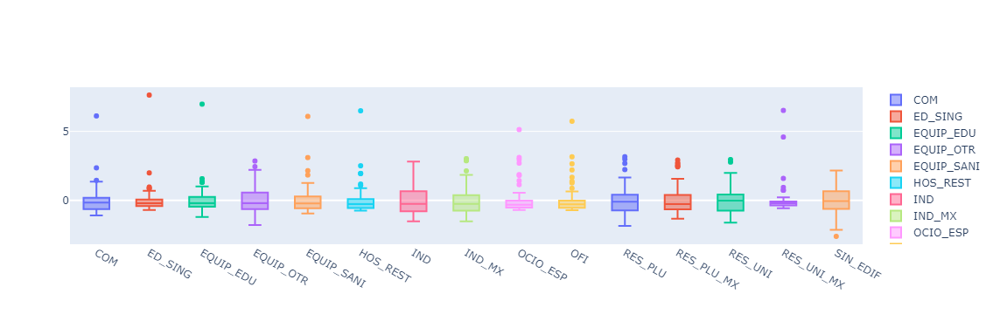

In [71]:
datos_st = df_st_usos_wide.iloc[:,1:17]

fig = go.Figure()

for col in datos_st:
    fig.add_trace(go.Box(y=datos_st[col].values, name = datos_st[col].name))
    
fig.show()
    

In [50]:
ciudades = df_mm_usos_wide.loc[:,'ciudades']
ciudades

0          Albacete
1            Alcala
2        Alcobendas
3          Alcorcon
4     Algeciras.shp
          ...      
69       Valladolid
70             Vigo
71           Zamora
72         Zaragoza
73      doshermanas
Name: ciudades, Length: 74, dtype: object

In [70]:
# Datos_mm
datos_mm = df_mm_usos_wide.iloc[:,1:17]
ciudades = df_mm_usos_wide.loc[:,['ciudades']]
fig = go.Figure()

for col in datos_mm:
    fig.add_trace(go.Box(y=datos_mm[col].values, name = datos_mm[col].name),
                  hovertemplate = 'ciudades: %{ciudades}')
    
fig.show()

TypeError: add_trace() got an unexpected keyword argument 'hovertemplate'

In [155]:
import plotly.graph_objs as go

In [61]:
Serie(df_mm_usos_wide.loc[:,['ciudades']])

NameError: name 'Serie' is not defined

In [156]:
df_mm_usos_wide.columns

Index(['ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF'],
      dtype='object', name='USO')

In [256]:
usos_wide_drop

,ciudades,COM,COM_iqr,ED_SING,ED_SING_iqr,EQUIP_EDU,EQUIP_EDU_iqr,EQUIP_OTR,EQUIP_OTR_iqr,EQUIP_SANI,...,RES_PLU,RES_PLU_MX,RES_PLU_MX_iqr,RES_PLU_iqr,RES_UNI,RES_UNI_MX,RES_UNI_MX_iqr,RES_UNI_iqr,SIN_EDIF,SIN_EDIF_iqr
0,Albacete,0.309544,tipico,4.775094,tipico,3.427693,tipico,4.188650,tipico,0.743391,...,6.551059,5.127209,tipico,tipico,22.820463,0.788167,tipico,atipico,30.443552,atipico
1,Alcala,1.056955,tipico,7.641072,tipico,5.264190,tipico,6.815778,tipico,1.005046,...,6.621817,2.875498,tipico,tipico,6.032543,0.313776,tipico,tipico,32.134984,atipico
2,Alcobendas,0.400440,tipico,5.448729,tipico,2.943100,tipico,5.116551,tipico,0.219057,...,5.923401,1.340272,tipico,tipico,19.175420,1.588624,tipico,atipico,48.639002,atipico
3,Alcorcon,1.212290,tipico,4.340481,tipico,7.349396,tipico,11.821959,atipico,1.882375,...,10.475900,4.596989,tipico,atipico,5.148168,0.131632,tipico,tipico,36.767081,atipico
4,Algeciras.shp,0.580857,tipico,1.030783,tipico,2.160662,tipico,3.990147,tipico,0.597612,...,3.154989,2.242866,tipico,tipico,25.815777,2.793453,tipico,atipico,49.716086,atipico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,0.404746,tipico,4.732781,tipico,4.599511,tipico,8.504691,atipico,1.662326,...,8.868738,5.696320,tipico,atipico,10.713216,0.915560,tipico,atipico,27.016471,atipico
70,Vigo,0.276154,tipico,2.100296,tipico,4.802969,tipico,4.406184,tipico,0.538630,...,0.791854,6.821427,tipico,tipico,5.153568,25.589182,atipico,tipico,35.613050,atipico
71,Zamora,0.750087,tipico,2.970423,tipico,4.444969,tipico,9.497844,atipico,2.365705,...,9.378723,5.071298,tipico,atipico,11.797034,1.704305,tipico,atipico,32.855046,atipico
72,Zaragoza,0.477597,tipico,4.504671,tipico,3.232540,tipico,4.556002,tipico,1.013548,...,7.585931,7.173644,tipico,tipico,8.182778,0.832779,tipico,atipico,37.145995,atipico


In [264]:
## Disminuir el tamano de la letra y agrupar por atipicos

fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='COM', values=usos_wide_drop['COM']),
                              dict(label='ED_SING', values=usos_wide_drop['ED_SING']),
                              dict(label='EQUIP_EDU', values=usos_wide_drop['EQUIP_EDU']),
                              dict(label='EQUIP_OTR', values=usos_wide_drop['EQUIP_OTR']),
                              dict(label='EQUIP_SANI', values=usos_wide_drop['EQUIP_SANI']),
                              dict(label='HOS_REST', values=usos_wide_drop['HOS_REST']),
                              dict(label='IND', values=usos_wide_drop['IND']),
                              dict(label='IND_MX', values=usos_wide_drop['IND_MX']),
                              dict(label='OCIO_ESP', values=usos_wide_drop['OCIO_ESP']),
                              dict(label='RES_PLU', values=usos_wide_drop['RES_PLU']),
                              dict(label='RES_PLU_MX', values=usos_wide_drop['RES_PLU_MX']),
                              dict(label='RES_UNI', values=usos_wide_drop['RES_UNI']),
                              dict(label='RES_UNI_MX', values=usos_wide_drop['RES_UNI_MX']),
                              dict(label='SIN_EDIF', values=usos_wide_drop['SIN_EDIF'])],
                  text = usos_wide_drop['ciudades'],
                  marker=dict(color=uso_wide_drop[:,['COM_iqr',]],
'ED_SING'                              size=5,
                              colorscale='Bluered',
                              line=dict(width=0.5,
                                        color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))
                
        

fig.update_layout(title="Scatterplot matrix",
                  dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')

fig.show()

NameError: name 'uso_wide_drop' is not defined

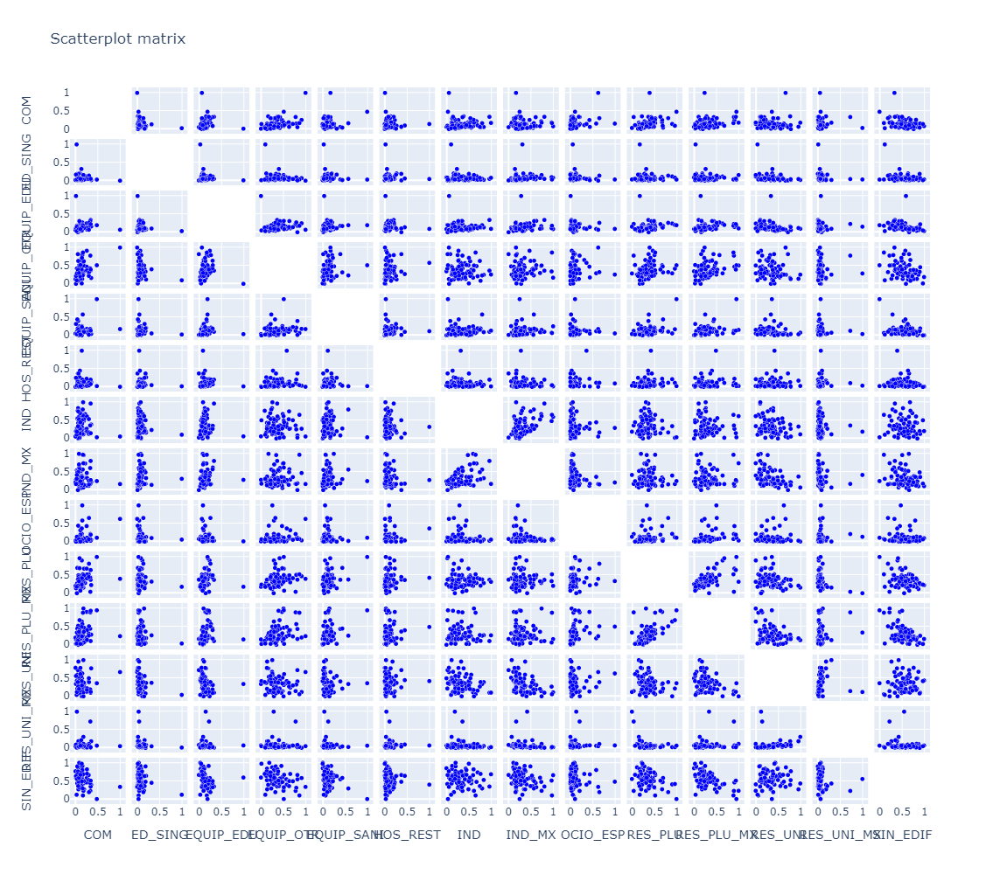

In [72]:
## Disminuir el tamano de la letra

fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='COM', values=df_mm_usos_wide['COM']),
                              dict(label='ED_SING', values=df_mm_usos_wide['ED_SING']),
                              dict(label='EQUIP_EDU', values=df_mm_usos_wide['EQUIP_EDU']),
                              dict(label='EQUIP_OTR', values=df_mm_usos_wide['EQUIP_OTR']),
                              dict(label='EQUIP_SANI', values=df_mm_usos_wide['EQUIP_SANI']),
                              dict(label='HOS_REST', values=df_mm_usos_wide['HOS_REST']),
                              dict(label='IND', values=df_mm_usos_wide['IND']),
                              dict(label='IND_MX', values=df_mm_usos_wide['IND_MX']),
                              dict(label='OCIO_ESP', values=df_mm_usos_wide['OCIO_ESP']),
                              dict(label='RES_PLU', values=df_mm_usos_wide['RES_PLU']),
                              dict(label='RES_PLU_MX', values=df_mm_usos_wide['RES_PLU_MX']),
                              dict(label='RES_UNI', values=df_mm_usos_wide['RES_UNI']),
                              dict(label='RES_UNI_MX', values=df_mm_usos_wide['RES_UNI_MX']),
                              dict(label='SIN_EDIF', values=df_mm_usos_wide['SIN_EDIF'])],
                  text = df_mm_usos_wide['ciudades'],
                  marker=dict(color="blue",
                              size=5,
                              colorscale='Bluered',
                              line=dict(width=0.5,
                                        color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))
                
        

fig.update_layout(title="Scatterplot matrix",
                  dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')

fig.show()

In [73]:
df_mm_usos_wide.columns

Index(['ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF'],
      dtype='object', name='USO')

In [76]:
from ipywidgets import widgets

https://plotly.com/python/figurewidget-app/ Widgets estudiar no es tan facil, pero hay que revisarlo.

https://pypi.org/project/plotly/

https://plotly.com/python/ml-regression/
https://plotly.com/python/ml-regression/
https://plotly.com/python/splom/
https://plotly.com/python/hover-text-and-formatting/
https://plotly.com/python/box-plots/

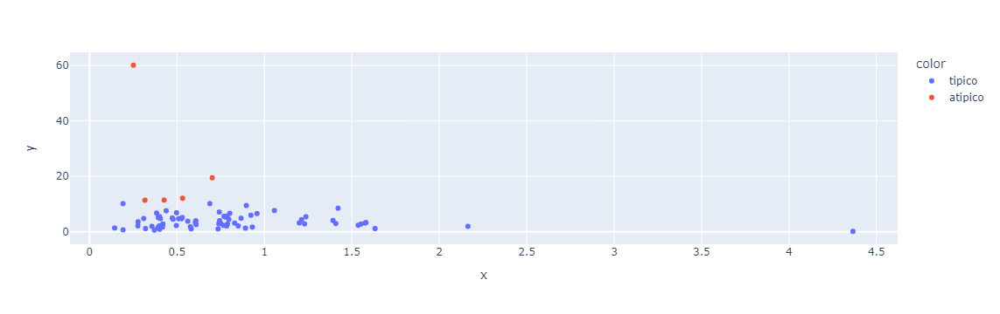

In [181]:
### Agregar variables y calcular el coeficiente de correlacion. Ver la opcion de hacer el grafico interactivo para elegir 
 # las variables dentro del notebook #
import plotly.express as px
fig = px.scatter(x= usos_wide_drop['COM'], y =usos_wide_drop['ED_SING'],
                 hover_data=[usos_wide_drop['ciudades']], color = usos_wide_drop["ED_SING_iqr"] )
fig.show()

In [ ]:
'ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF'

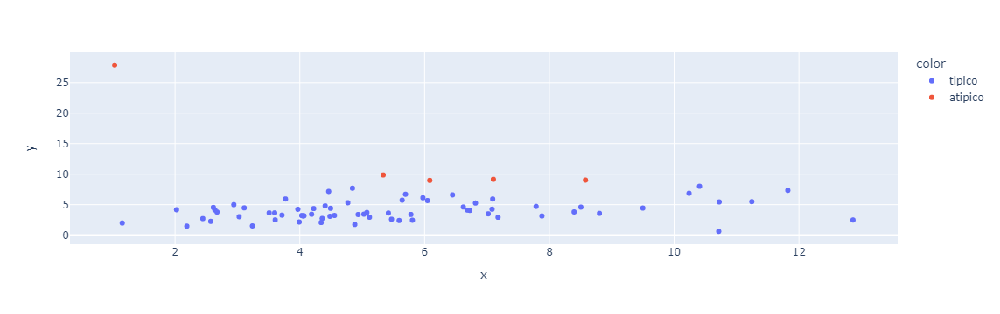

In [180]:
### Agregar variables y calcular el coeficiente de correlacion. Ver la opcion de hacer el grafico interactivo para elegir 
 # las variables dentro del notebook #
import plotly.express as px
fig = px.scatter(x= usos_wide_drop['EQUIP_OTR'], y =usos_wide_drop['EQUIP_EDU'],
                 hover_data=[usos_wide_drop['ciudades']],  color = usos_wide_drop["EQUIP_EDU_iqr"] )
fig.show()

In [151]:
from scipy.stats import pearsonr
corr_test = pearsonr(x = df_mm_usos_wide['COM'], y = df_mm_usos_wide['EQUIP_EDU'])
corr_test

PearsonRResult(statistic=0.010957672912635155, pvalue=0.9261741131482437)

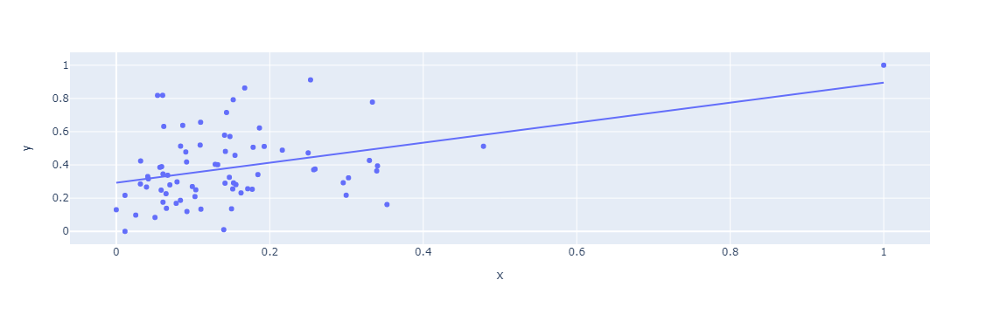

In [78]:
import plotly.express as px
fig = px.scatter(x= df_mm_usos_wide['COM'], y =df_mm_usos_wide['EQUIP_OTR'],
                 hover_data=[df_mm_usos_wide['ciudades']], trendline="ols")
fig.show()

In [81]:
from sklearn.linear_model import LinearRegression

In [84]:
lm = LinearRegression(fit_intercept = True)


In [ ]:
x = df_mm_usos_wide['COM']).reshape(-1,1)

In [138]:
from scipy.stats import pearsonr
corr_test = pearsonr(x = df_mm_usos_wide['COM'], y = df_mm_usos_wide['EQUIP_OTR'])
corr_test

PearsonRResult(statistic=0.3871572254783993, pvalue=0.0006551730578895997)

In [148]:
 lm.fit(X=np.array(df_mm_usos_wide['COM']).reshape(-1,1), y = np.array(df_mm_usos_wide['EQUIP_OTR']).reshape(-1,1))



LinearRegression()

In [150]:
modelo = smf.ols(formula = 'COM ~ EQUIP_OTR', data = df_mm_usos_wide)
results = modelo.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    COM   R-squared:                       0.150
Model:                            OLS   Adj. R-squared:                  0.138
Method:                 Least Squares   F-statistic:                     12.69
Date:                Wed, 15 Feb 2023   Prob (F-statistic):           0.000655
Time:                        15:59:25   Log-Likelihood:                 47.229
No. Observations:                  74   AIC:                            -90.46
Df Residuals:                      72   BIC:                            -85.85
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0564      0.031      1.832      0.071      -0.005       0.118
EQUIP_OTR      0.2487      0.070      3.563      0.001       0.110       0.388
==============================================================================
Omnibus:                       61.670   Durbin-Watson:                   2.306
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              383.894
Skew:                           2.440   Prob(JB):                     4.35e-84
Kurtosis:                      13.035   Cond. No.                         5.35
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [158]:
x_1_preds = [i for i in np.arange(0.0, max(df_mm_usos_wide['EQUIP_OTR']), 0.01)]
y_hat = results.predict({'EQUIP_OTR': x_1_preds})

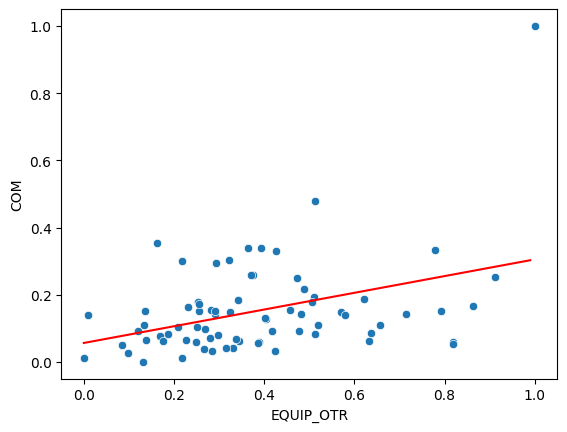

In [162]:

preds = {'EQUIP_OTR': x_1_preds, 'y_hat': y_hat}

sns.scatterplot(x = 'EQUIP_OTR', y = 'COM', data = df_mm_usos_wide)
sns.lineplot(x = 'EQUIP_OTR', y = 'y_hat', data = preds, color = 'red')
plt.show()

In [140]:
print("La regression tienen un coeficiente de {} y un intercept de {}".format(lm.coef_,lm.intercept_))

La regression tienen un coeficiente de [[0.60258721]] y un intercept de [0.29299497]


In [191]:
cook[0].shape # los puntos cook y los coeficiente de determinacion R2.

(74,)

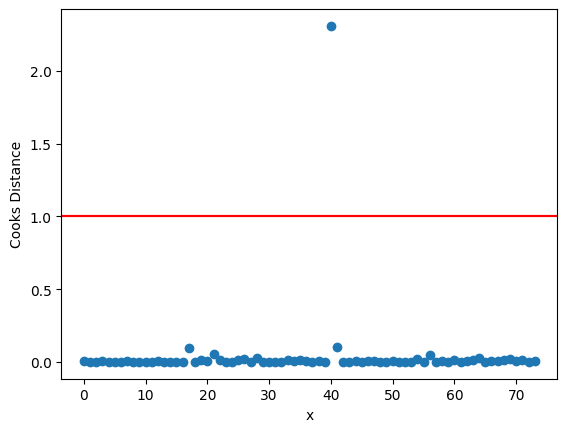

In [186]:
### Hacer este grafico con plotly ###

cook = results.get_influence().cooks_distance

plt.scatter(list(df_mm_usos_wide.index), cook[0])
plt.xlabel('x')
plt.ylabel('Cooks Distance')
plt.axhline(y = 1, color = 'r', linestyle = '-')
plt.axhline(y  = 1, color = 'r', linestyle = "-")
plt.show()

 ## Como comentaron en el curso en la clase de alvaro la estandarizacion minmax no cambia la distribicion de los datos #

Tendriamos que probar con los datos originales y escalarlos usando el escalado de la distribucion. Esto confirma que el proceso de escalado no cambia la distribucion de los datos. 

# Correlacion entre variables.

In [75]:
from ipywidgets import widgets

ModuleNotFoundError: No module named 'ipywidgets'

In [160]:
df_st_usos_wide.iloc[:,1:].corr().style.background_gradient(cmap="plasma")

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
USO,,,,,,,,,,,,,,,
COM,1.000000,-0.171916,0.010958,0.387157,0.207960,-0.085987,-0.048631,-0.053067,0.358068,0.528583,0.290694,0.278789,0.009398,0.011110,-0.322747
ED_SING,-0.171916,1.000000,-0.147897,-0.148617,-0.091755,-0.028666,-0.117596,0.062886,-0.091357,-0.069724,-0.082025,-0.136050,-0.263952,-0.109607,-0.252807
EQUIP_EDU,0.010958,-0.147897,1.000000,0.004304,0.096067,-0.051722,-0.044592,0.145948,-0.062038,0.042743,0.149406,0.153816,-0.229949,0.005655,-0.227007
EQUIP_OTR,0.387157,-0.148617,0.004304,1.000000,0.197918,0.137045,-0.082795,0.080090,0.123343,0.326414,0.256789,0.373162,-0.182241,0.007358,-0.351732
EQUIP_SANI,0.207960,-0.091755,0.096067,0.197918,1.000000,-0.026664,-0.038155,0.037556,-0.077576,-0.023693,0.426473,0.308517,-0.152882,-0.120429,-0.306463
HOS_REST,-0.085987,-0.028666,-0.051722,0.137045,-0.026664,1.000000,-0.087121,-0.136246,0.118974,-0.031205,0.105491,0.110790,0.085655,-0.011346,-0.112209
IND,-0.048631,-0.117596,-0.044592,-0.082795,-0.038155,-0.087121,1.000000,0.440360,-0.157914,-0.252894,-0.106594,-0.064779,-0.317524,-0.141290,-0.108406
IND_MX,-0.053067,0.062886,0.145948,0.080090,0.037556,-0.136246,0.440360,1.000000,-0.185202,-0.165919,-0.075790,0.029768,-0.460009,-0.107157,-0.255457
OCIO_ESP,0.358068,-0.091357,-0.062038,0.123343,-0.077576,0.118974,-0.157914,-0.185202,1.000000,0.351177,0.153520,0.278919,0.078559,0.055814,-0.126236


Como vimos con marcos las correlaciones son bajas

https://stackoverflow.com/questions/14745022/how-to-split-a-dataframe-string-column-into-two-columns

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt


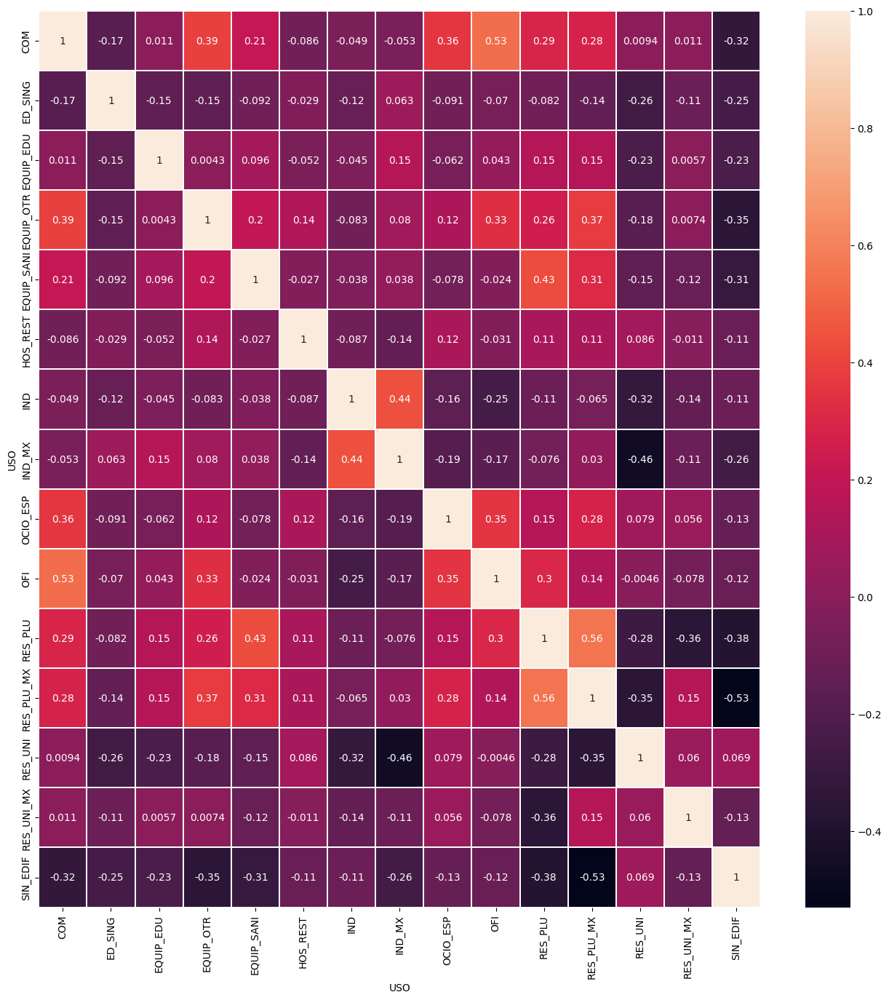

In [162]:
# como regular los colores queremos que las correlaciones que se marquen en color se puedan fijar por algun umbral.

plt.figure(figsize=(16, 16))
sns.heatmap(df_st_usos_wide.iloc[:,1:].corr(), annot=True, linewidths = 0.2, linecolor = 'white')
plt.show()

Revisar que valores de correlacion hay entre las variables si usamos una correlacion de spearman.

https://towardsdatascience.com/clearly-explained-pearson-v-s-spearman-correlation-coefficient-ada2f473b8#:~:text=Comparison%20of%20Pearson%20and%20Spearman,with%20monotonic%20relationships%20as%20well.

<AxesSubplot:xlabel='USO', ylabel='USO'>

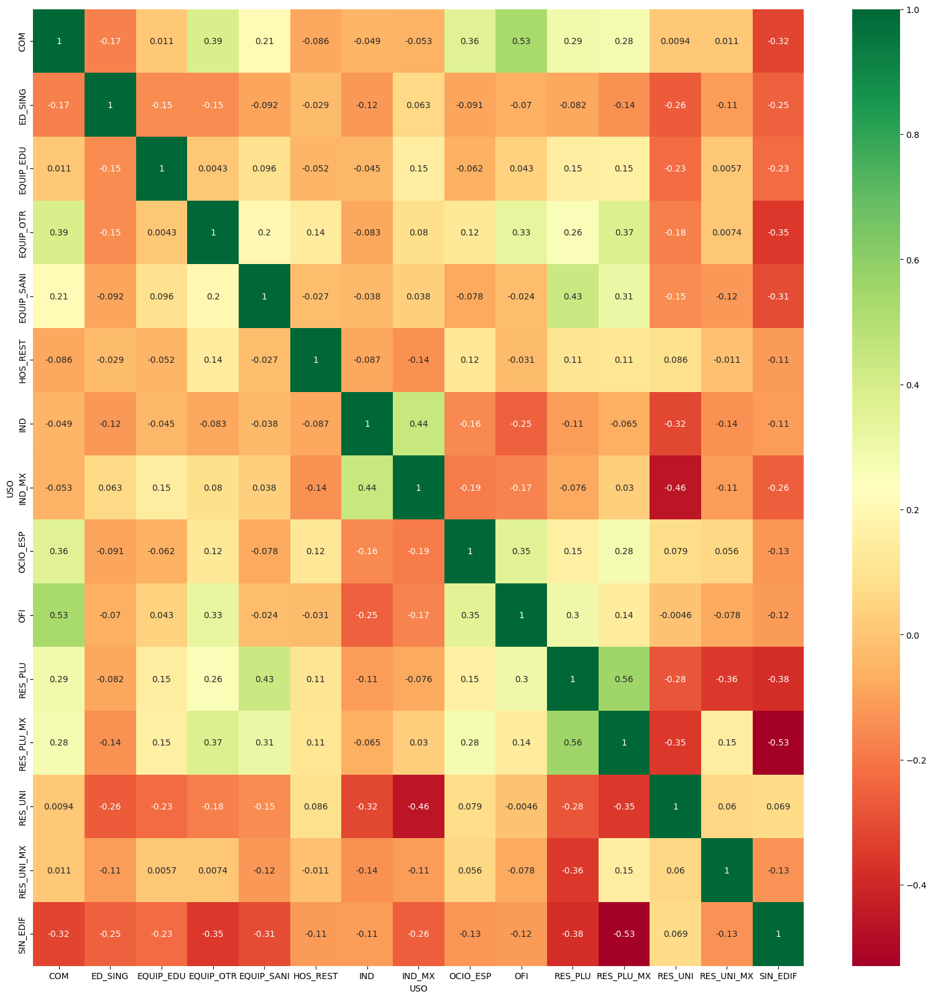

In [163]:
import seaborn as sns
plt.figure(figsize = (20,20))
sns.heatmap(data = df_st_usos_wide.iloc[:,1:].corr(), annot = True, cmap = "RdYlGn")


In [164]:
## Podriamos agregar aqui el analisis del VIF ##

## El Analisis factorial lo vamos a hacer en r

## Si la correlacion entre variables es muy baja, quizas podemos hacer el analisis cluster directamente. Sin embargo, este va a estar influenciado por outiers tambien.

**Intentos TSNE**

In [1]:
from sklearn.manifold import TSNE

In [166]:
tsne = TSNE(n_components = 2, random_state = 42, n_iter = 5000)


In [167]:
df_st_usos_wide.iloc[:,1:16]

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,-0.813290,-0.049699,-0.362505,-0.546259,-0.543095,-0.074136,0.888200,0.155427,-0.361409,-0.200697,-0.450751,-0.340093,1.112127,-0.360938,-0.529560
1,0.463564,0.347774,0.188566,0.482498,-0.348819,0.029019,1.401590,1.810649,-0.274188,1.262848,-0.433622,-0.928554,-0.960115,-0.492499,-0.345475
2,-0.658007,0.043725,-0.507915,-0.182902,-0.932408,-0.464191,-1.526956,-0.423970,-0.654867,3.155719,-0.602688,-1.329770,0.662196,-0.138949,1.450724
3,0.728934,-0.109974,0.814266,2.442868,0.302588,-0.497148,-0.355737,0.619759,-0.494151,-0.471754,0.499337,-0.478660,-1.069279,-0.543013,0.158655
4,-0.349787,-0.568984,-0.742698,-0.623990,-0.651335,-0.128998,-0.881782,-1.041140,-0.472231,-0.535585,-1.272839,-1.093886,1.481858,0.195183,1.567947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,-0.650650,-0.055567,-0.010882,1.143860,0.139204,-0.079060,1.729283,0.724482,0.134347,-0.281064,0.110290,-0.191361,-0.382349,-0.325608,-0.902543
70,-0.870332,-0.420657,0.050169,-0.461075,-0.695128,-0.480798,-0.707694,0.376578,0.086315,-0.403123,-1.844883,0.102674,-1.068612,6.517062,0.033057
71,-0.060680,-0.299982,-0.057255,1.532768,0.661456,-0.435892,0.663817,0.112098,-0.400548,-0.608000,0.233743,-0.354704,-0.248566,-0.106868,-0.267108
72,-0.526193,-0.087203,-0.421064,-0.402407,-0.342507,-0.654527,0.753573,1.693329,-0.284124,-0.546065,-0.200239,0.194722,-0.694697,-0.348566,0.199894


In [52]:
usos_wide.iloc[:,2:17]

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
2,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
3,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
4,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471
70,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050
71,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046
72,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,0.172093,7.585931,7.173644,8.182778,0.832779,37.145995


In [168]:
tsne_res_2d_df = tsne.fit_transform(usos_wide.iloc[:,2:17])
tsne_res_2d_mm = tsne.fit_transform(df_mm_usos_wide.iloc[:,1:16])
tsne_res_2d_st = tsne.fit_transform(df_st_usos_wide.iloc[:,1:16])

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\crist\miniconda3\envs\datamecum\lib\site-packages\sklearn\manifold\

In [169]:
tsne_res_2d_df

array([[ -9.684072 ,  11.417416 ],
       [ -5.312463 ,   9.396522 ],
       [ -7.698813 ,  14.5855665],
       [ -6.661006 ,   9.375474 ],
       [ -8.487776 ,  14.808726 ],
       [ -9.856804 ,  12.003093 ],
       [ -8.650797 ,  12.348487 ],
       [-10.526879 ,   9.344642 ],
       [-11.145984 ,  12.900609 ],
       [ -8.314159 ,   8.458864 ],
       [ -7.7989736,   7.392395 ],
       [ -4.8557878,  10.605709 ],
       [ -7.8168106,  11.495521 ],
       [ -7.3786073,   7.2787843],
       [ -7.645    ,  14.388152 ],
       [ -6.404926 ,  13.291843 ],
       [ -7.1950293,  12.488592 ],
       [ -8.473941 ,  11.056499 ],
       [-11.281552 ,  12.502283 ],
       [ -6.366531 ,  12.422009 ],
       [ -5.529253 ,  13.567911 ],
       [-10.719502 ,  12.290678 ],
       [ -5.03916  ,   8.409383 ],
       [ -5.247352 ,   9.914144 ],
       [ -6.342884 ,  10.972488 ],
       [ -6.4781127,   5.552125 ],
       [ -8.554851 ,   8.5481   ],
       [ -5.7886868,  13.326078 ],
       [ -5.760056 ,

In [170]:
df_tsne = pd.DataFrame({'x':tsne_res_2d_df[:,0], 'y':tsne_res_2d_df[:,1]})
df_tsne_mm = pd.DataFrame({"x":tsne_res_2d_mm[:,0], "y":tsne_res_2d_mm[:,1]})
df_tsne_st = pd.DataFrame({"x":tsne_res_2d_st[:,0], "y":tsne_res_2d_st[:,1]})

In [171]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

In [172]:
usos_wide.loc[:,['ciudades', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']].head(5)

USO,ciudades,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
0,Albacete,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552
1,Alcala,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984
2,Alcobendas,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002
3,Alcorcon,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081
4,Algeciras.shp,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086


In [241]:
Ag_tsne = AgglomerativeClustering(n_clusters = 4)

Ag_tsne_df_cluster = Ag_tsne.fit(df_tsne.loc[:,['x','y']])
Ag_tsne_mm_cluster = Ag_tsne.fit(df_tsne_mm.loc[:,['x','y']])
Ag_tsne_st_cluster = Ag_tsne.fit(df_tsne_st.loc[:,['x','y']])

uso_wide_cluster = Ag_tsne.fit(usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])

mm_usos_wide_cluster = Ag_tsne.fit(df_mm_usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])

st_usos_wide_cluster = Ag_tsne.fit(df_st_usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])

In [174]:
uso_wide_cluster.labels_

array([0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 2, 1, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 3, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 2, 2, 0, 2, 0,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 2, 0, 1, 0, 2, 0, 0, 0, 0, 0,
       0, 0, 2, 1, 3, 1, 1, 0], dtype=int64)

In [243]:
kmeans_tsne = KMeans(n_clusters = 4)
k_tsne_df = kmeans_tsne.fit(df_tsne.loc[:,['x','y']])
k_tsne_mm = kmeans_tsne.fit(df_tsne_mm.loc[:,["x","y"]])
k_tsne_st = kmeans_tsne.fit(df_tsne_st.loc[:,["x","y"]])

k_uso_wide_cluster = kmeans_tsne.fit(usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])

k_mm_usos_wide_cluster = kmeans_tsne.fit(df_mm_usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])

k_st_usos_wide_cluster = kmeans_tsne.fit(df_st_usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']])


In [248]:
# Incorporar ciudades
df_tsne["ciudades"]  = df_mm_usos_wide.loc[:,"ciudades"]
df_tsne_mm["ciudades"] = df_mm_usos_wide.loc[:,"ciudades"]
df_tsne_st["ciudades"] = df_st_usos_wide.loc[:,"ciudades"]

## Incorporar cluster kmeans en dataframe tsne 
df_tsne['k_cluster'] = k_tsne_df.labels_
df_tsne_mm["kcluster_mm"] = k_tsne_mm.labels_
df_tsne_st["kcluster_st"] = k_tsne_st.labels_

## Incorporar clusters en hierarquical en dataframes tsne
df_tsne['hcluster_tsne'] = Ag_tsne_df_cluster.labels_
df_tsne_mm["hcluster_mm_tsne"] = Ag_tsne_mm_cluster.labels_
df_tsne_st["hcluster_st_tsne"] = Ag_tsne_st_cluster.labels_

# Incoporar kulster k means en base de datos df_mm_usos_wide
df_mm_usos_wide['kcluster'] = k_mm_usos_wide_cluster.labels_
df_st_usos_wide['kcluster'] = k_st_usos_wide_cluster.labels_

usos_wide['kcluster_or'] = k_uso_wide_cluster.labels_
usos_wide['kcluster_mm'] = k_mm_usos_wide_cluster.labels_ 
usos_wide['kcluster_st'] = k_st_usos_wide_cluster.labels_


usos_wide['hcluster_or'] = uso_wide_cluster.labels_
usos_wide['hcluster_mm'] = mm_usos_wide_cluster.labels_
usos_wide['hcluster_st'] = st_usos_wide_cluster.labels_


In [ ]:
# Agregamos algunas etiquetas al data original que provienen del TSNE

In [249]:
usos_wide["kcluster_st_tsne"] = df_tsne_st["kcluster_st"] 

In [178]:
import seaborn as sn

<AxesSubplot:xlabel='x', ylabel='y'>

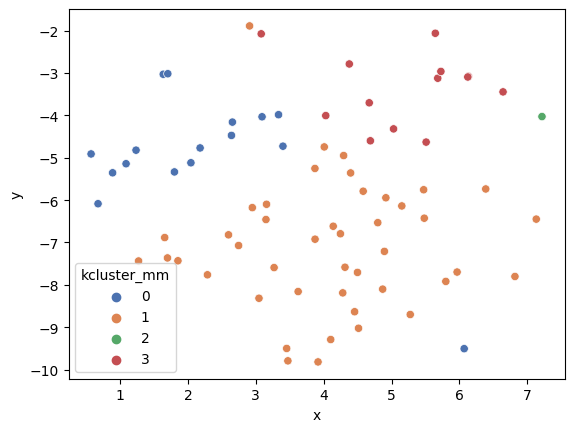

In [179]:
sn.scatterplot(data = df_tsne_mm, x = 'x', y = 'y', hue = "kcluster_mm", palette = "deep")

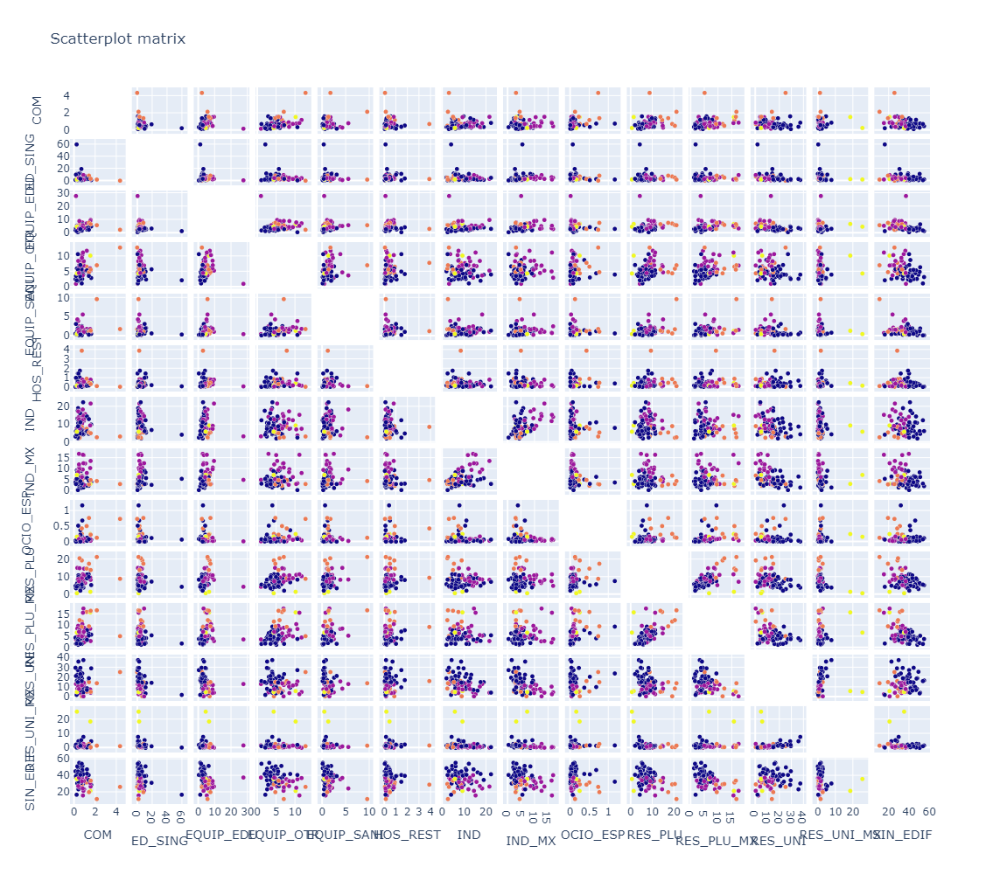

In [180]:
## Disminuir el tamano de la letra

fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='COM', values=usos_wide['COM']),
                              dict(label='ED_SING', values=usos_wide['ED_SING']),
                              dict(label='EQUIP_EDU', values=usos_wide['EQUIP_EDU']),
                              dict(label='EQUIP_OTR', values=usos_wide['EQUIP_OTR']),
                              dict(label='EQUIP_SANI', values=usos_wide['EQUIP_SANI']),
                              dict(label='HOS_REST', values=usos_wide['HOS_REST']),
                              dict(label='IND', values=usos_wide['IND']),
                              dict(label='IND_MX', values=usos_wide['IND_MX']),
                              dict(label='OCIO_ESP', values=usos_wide['OCIO_ESP']),
                              dict(label='RES_PLU', values=usos_wide['RES_PLU']),
                              dict(label='RES_PLU_MX', values=usos_wide['RES_PLU_MX']),
                              dict(label='RES_UNI', values=usos_wide['RES_UNI']),
                              dict(label='RES_UNI_MX', values=usos_wide['RES_UNI_MX']),
                              dict(label='SIN_EDIF', values=usos_wide['SIN_EDIF'])],
                  text = df_mm_usos_wide['ciudades'],
                  marker=dict(color= usos_wide['Agcluster_mm'],
                              size=5,
                              showscale=False,
                              line=dict(width=0.5,
                                        color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))
                
        

fig.update_layout(title="Scatterplot matrix",
                  dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')

fig.show()

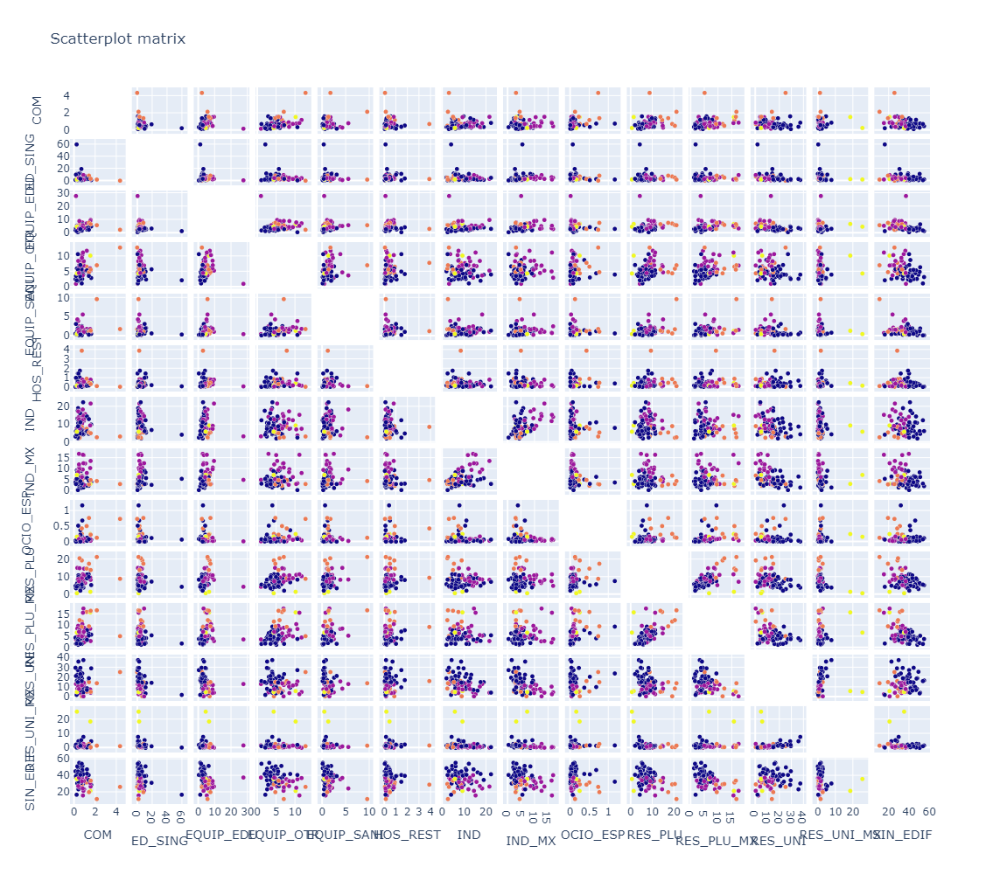

In [68]:
## Disminuir el tamano de la letra

fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='COM', values=usos_wide['COM']),
                              dict(label='ED_SING', values=usos_wide['ED_SING']),
                              dict(label='EQUIP_EDU', values=usos_wide['EQUIP_EDU']),
                              dict(label='EQUIP_OTR', values=usos_wide['EQUIP_OTR']),
                              dict(label='EQUIP_SANI', values=usos_wide['EQUIP_SANI']),
                              dict(label='HOS_REST', values=usos_wide['HOS_REST']),
                              dict(label='IND', values=usos_wide['IND']),
                              dict(label='IND_MX', values=usos_wide['IND_MX']),
                              dict(label='OCIO_ESP', values=usos_wide['OCIO_ESP']),
                              dict(label='RES_PLU', values=usos_wide['RES_PLU']),
                              dict(label='RES_PLU_MX', values=usos_wide['RES_PLU_MX']),
                              dict(label='RES_UNI', values=usos_wide['RES_UNI']),
                              dict(label='RES_UNI_MX', values=usos_wide['RES_UNI_MX']),
                              dict(label='SIN_EDIF', values=usos_wide['SIN_EDIF'])],
                  text = df_mm_usos_wide['ciudades'],
                  marker=dict(color= usos_wide['kcluster'],
                              size=5,
                              showscale=False,
                              line=dict(width=0.5,
                                        color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))
                
        

fig.update_layout(title="Scatterplot matrix",
                  dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')

fig.show()

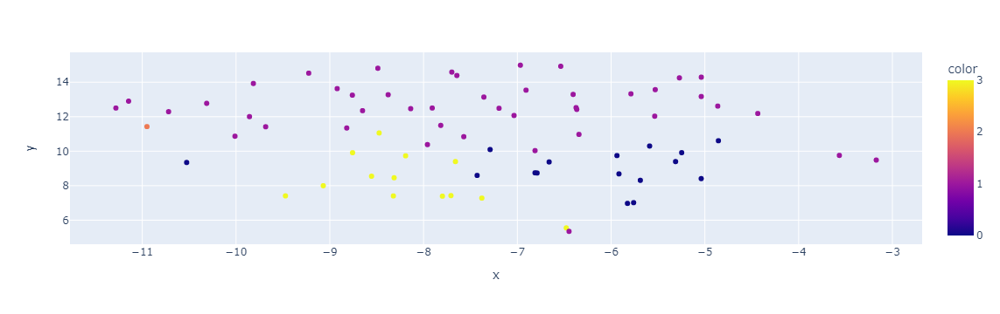

In [181]:
import plotly.express as px
fig = px.scatter(x= df_tsne['x'], y =df_tsne['y'], color=df_tsne['k_cluster'],
                 hover_data=[df_tsne['ciudades']])
fig.show()

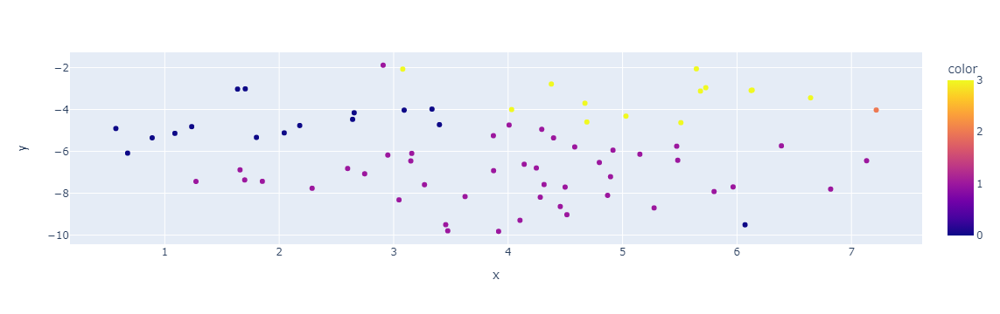

In [183]:
import plotly.express as px
fig = px.scatter(x= df_tsne_mm['x'], y =df_tsne_mm['y'], color=df_tsne_mm['kcluster_mm'],
                 hover_data=[df_tsne_mm['ciudades']])
fig.show()

In [184]:
df_tsne_st

,x,y,ciudades,kcluster_st,Agcluster_st
0,-4.573763,-3.003909,Albacete,1,0
1,-4.775520,-0.006230,Alcala,0,1
2,-6.906543,-4.986769,Alcobendas,1,0
3,-6.456182,0.002564,Alcorcon,0,1
4,-5.491458,-4.601731,Algeciras.shp,1,0
...,...,...,...,...,...
69,-5.495606,-0.559351,Valladolid,0,1
70,-1.816718,-2.465945,Vigo,1,3
71,-6.270429,-0.827069,Zamora,0,1
72,-4.947643,-1.039344,Zaragoza,0,1


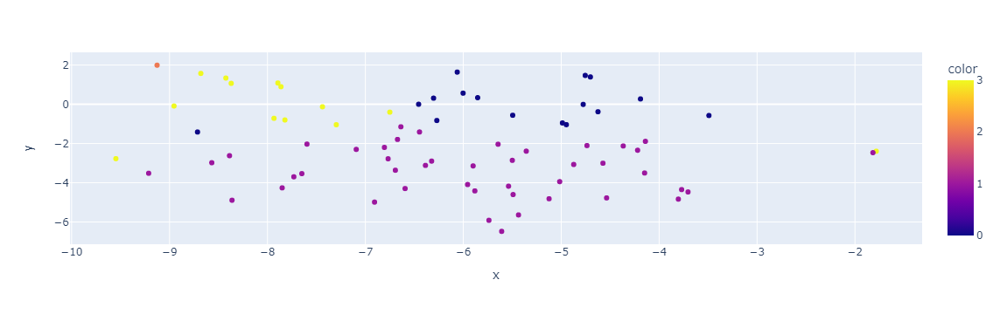

In [237]:
import plotly.express as px
fig = px.scatter(x= df_tsne_st['x'], y =df_tsne_st['y'], color=df_tsne_st['kcluster_st'],
                 hover_data=[df_tsne_st['ciudades']])
fig.show()

# Ahora vamos a ver el resultado de los cluster jerarquicos 


In [186]:
df_tsne

,x,y,ciudades,k_cluster,Agcluster
0,-9.684072,11.417416,Albacete,1,0
1,-5.312463,9.396522,Alcala,0,1
2,-7.698813,14.585567,Alcobendas,1,0
3,-6.661006,9.375474,Alcorcon,0,1
4,-8.487776,14.808726,Algeciras.shp,1,0
...,...,...,...,...,...
69,-5.916374,8.683421,Valladolid,0,1
70,-6.448639,5.350842,Vigo,1,3
71,-7.290222,10.094586,Zamora,0,1
72,-5.589414,10.298352,Zaragoza,0,1


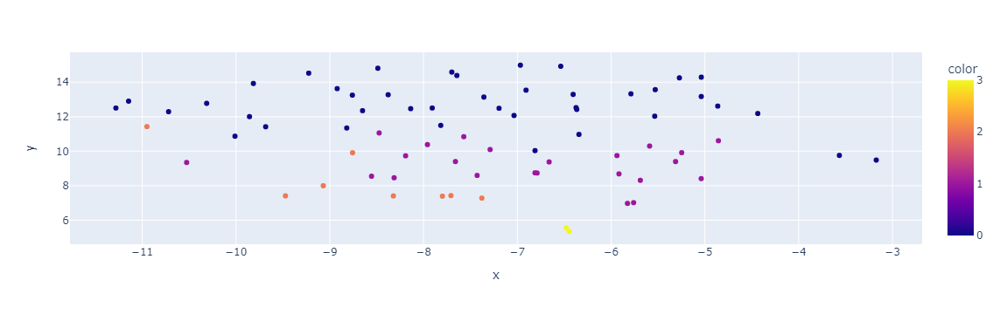

In [187]:
fig = px.scatter(x= df_tsne['x'], y =df_tsne['y'], color=df_tsne['Agcluster'],
                 hover_data=[df_tsne_st['ciudades']])
fig.show()

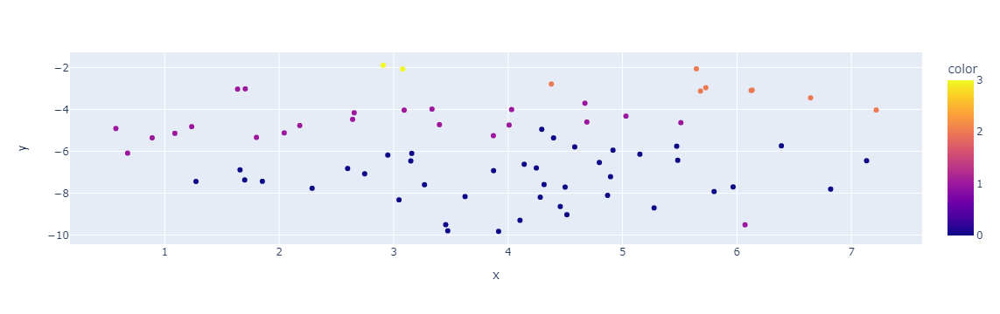

In [188]:
fig = px.scatter(x= df_tsne_mm['x'], y =df_tsne_mm['y'], color=df_tsne['Agcluster'],
                 hover_data=[df_tsne_mm['ciudades']])
fig.show()

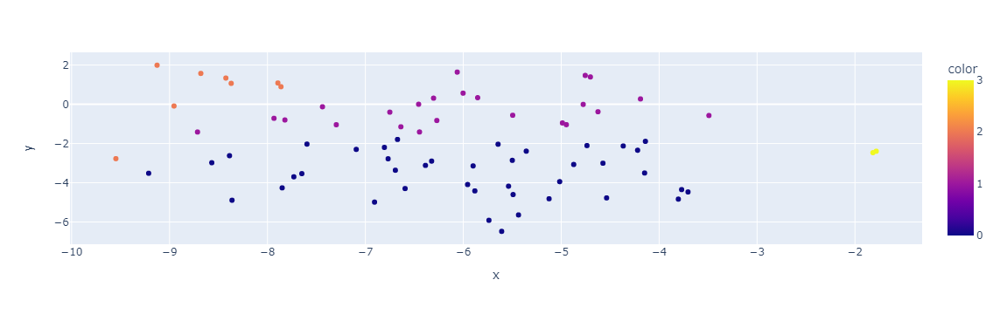

In [189]:
fig = px.scatter(x= df_tsne_st['x'], y =df_tsne_st['y'], color=df_tsne_st['Agcluster_st'],
                 hover_data=[df_tsne_st['ciudades']])
fig.show()

Los resultados anteriores pueden estar influido debido a que la escala de las dimensiones del TSNE no esta estandarizadas y por eso algunos patrones extranos. 

1.- Una opcion es volver a hacer los cluster estandarizando el TSNE. 
2.- Otra opcion es jugar con los parametros del TSNE para ver si podemos encontrar el mejor patron. 
3.- La tarcera opcion es volver hacerlo con 3 dimensiones.
4.- Volver a hacerlo después de descartar los outliers. 

Podemos hacer un ensayo del árbol de decisión, sobre los del TSNE y las variables originales.

1.- Primer aproximacion vamos a calcular el mejor cluster 

In [190]:
## Tenemos aquí que hacer el analisis de los grupos con group.by

df_st_usos_wide["cluster_st"] = df_tsne_st['Agcluster_st']

1.- Vamos a realizar un arbol a partir de los valores de los cluster construidos a partir de los datos originales estandarizados.

2- Segundo arbol a partir de los clusters construidos a partir de los agrupamientos detectados por el TSN a partir de datos estandarizados. 

In [223]:
usos_wide["cluster_st_tsne"] = df_tsne_st['Agcluster_st']

In [192]:
usos_wide.head(5)

USO,ciudades,extension,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,...,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,kcluster,Agcluster,Agcluster_mm,Agcluster_st
0,Albacete,class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,...,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552,0,1,0,0
1,Alcala,class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,...,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984,1,0,1,1
2,Alcobendas,class.shp,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,...,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002,0,1,0,0
3,Alcorcon,class.shp,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,...,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081,1,0,1,1
4,Algeciras.shp,None,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,...,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086,0,1,0,0


In [79]:
usos_wide.columns

Index(['ciudades', 'extension', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF', 'kcluster',
       'Agcluster', 'Agcluster_mm', 'Agcluster_st', 'cluster_st',
       'Ag_cluster'],
      dtype='object', name='USO')

In [80]:
mean_cluster_TSNE_st  = usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF','cluster_st']].groupby(by = "cluster_st", axis = 0).mean()



In [81]:
mean_cluster_TSNE_st

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF
cluster_st,,,,,,,,,,,,,,,
0,0.641452,5.928007,3.284810,4.442808,1.081634,0.433154,8.777758,4.537451,0.138567,0.379308,6.731736,4.692073,17.118800,1.868513,39.943929
1,0.750649,4.341971,6.644792,6.998073,1.899842,0.325443,11.674666,9.073408,0.076389,0.425091,9.452565,7.080127,9.437820,0.994844,30.824319
2,1.592696,4.010482,5.483811,6.929125,2.397214,0.908865,5.595461,4.131309,0.405493,1.454016,15.844548,12.222767,11.477812,1.364553,26.181848
3,0.914410,2.438798,5.834752,7.322269,0.958653,0.326639,7.723966,5.253064,0.211483,0.340381,1.202329,11.356368,5.616251,22.113747,28.386891


In [193]:
mean_cluster_TSNE_st = mean_cluster_TSNE_st.reset_index()

In [194]:
mean_cluster_TSNE_st.columns
variables = ['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']

In [195]:
long_mean_cluster_TSNE_st = pd.melt(mean_cluster_TSNE_st, id_vars = "cluster_st", value_vars = variables )

In [196]:
long_mean_cluster_TSNE_st

,cluster_st,USO,value
0,0,COM,0.641452
1,1,COM,0.750649
2,2,COM,1.592696
3,3,COM,0.914410
4,0,ED_SING,5.928007
5,1,ED_SING,4.341971
6,2,ED_SING,4.010482
7,3,ED_SING,2.438798
8,0,EQUIP_EDU,3.284810
9,1,EQUIP_EDU,6.644792


In [88]:
import seaborn.objects as so
from seaborn import axes_style


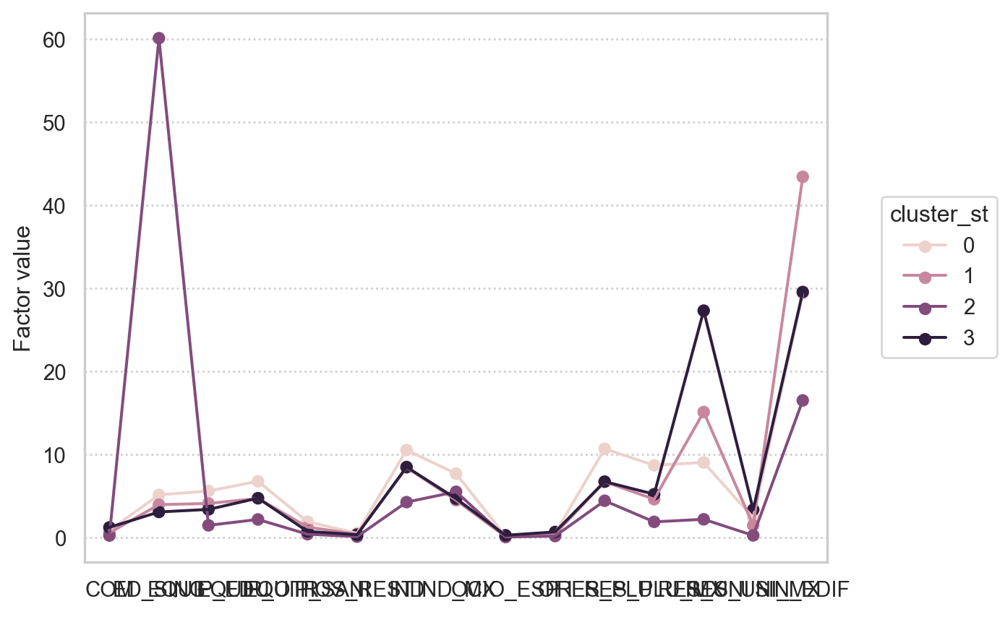

In [89]:
(
    so.Plot(long_mean_cluster_TSNE_st, x="USO", y="value", color = "cluster_st").theme({**axes_style("whitegrid"), "grid.linestyle": ":"})
    .add(so.Dot())
    .add(so.Line())
    .label(
        x = "  ",
        y = "Factor value"
    )
)

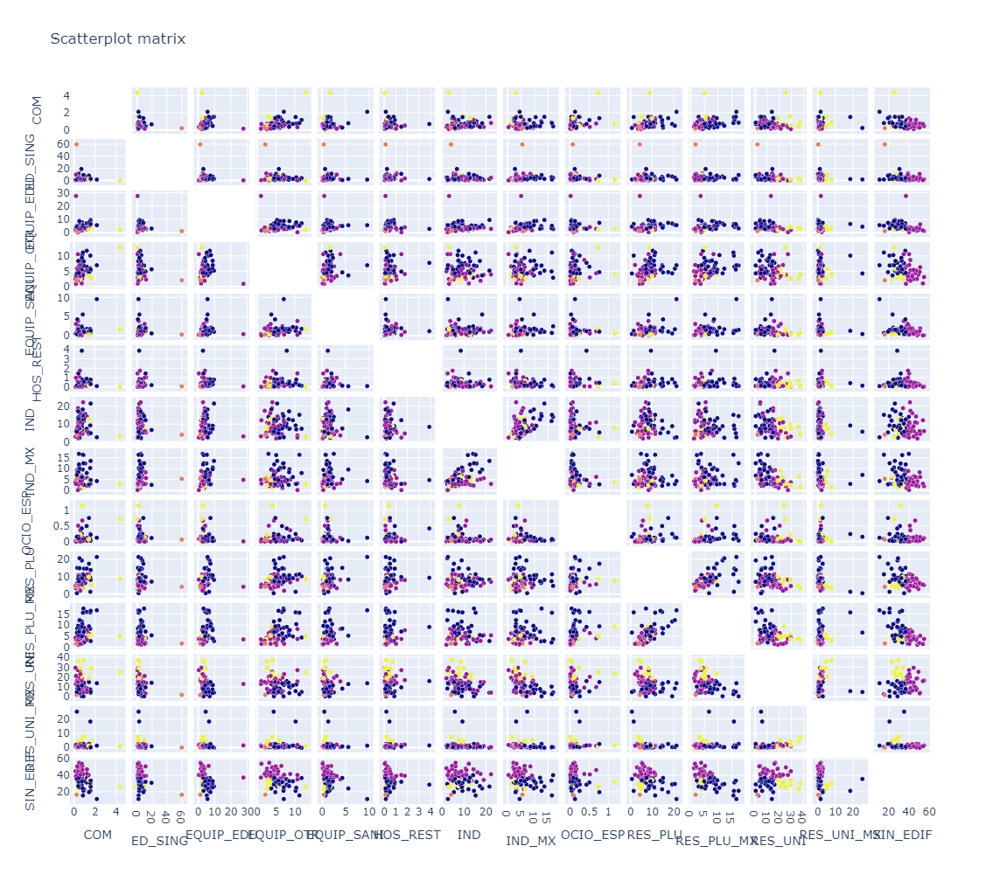

In [91]:
fig = go.Figure(data=go.Splom(
                  dimensions=[dict(label='COM', values=usos_wide['COM']),
                              dict(label='ED_SING', values=usos_wide['ED_SING']),
                              dict(label='EQUIP_EDU', values=usos_wide['EQUIP_EDU']),
                              dict(label='EQUIP_OTR', values=usos_wide['EQUIP_OTR']),
                              dict(label='EQUIP_SANI', values=usos_wide['EQUIP_SANI']),
                              dict(label='HOS_REST', values=usos_wide['HOS_REST']),
                              dict(label='IND', values=usos_wide['IND']),
                              dict(label='IND_MX', values=usos_wide['IND_MX']),
                              dict(label='OCIO_ESP', values=usos_wide['OCIO_ESP']),
                              dict(label='RES_PLU', values=usos_wide['RES_PLU']),
                              dict(label='RES_PLU_MX', values=usos_wide['RES_PLU_MX']),
                              dict(label='RES_UNI', values=usos_wide['RES_UNI']),
                              dict(label='RES_UNI_MX', values=usos_wide['RES_UNI_MX']),
                              dict(label='SIN_EDIF', values=usos_wide['SIN_EDIF'])],
                  text = (usos_wide.loc[:,"ciudades"]),
                  marker=dict(color= usos_wide['cluster_mm'],
                              size=5,
                              showscale=False,
                              line=dict(width=0.5,
                                        color='rgb(230,230,230)')),
                  diagonal=dict(visible=False)))
                
        

fig.update_layout(title="Scatterplot matrix",
                  dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')

fig.show()

In [92]:
usos_wide.iloc[:,2:18]

USO,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,OCIO_ESP,OFI,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,kclustes
0,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,0.077490,0.384967,6.551059,5.127209,22.820463,0.788167,30.443552,3
1,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,0.095006,1.287052,6.621817,2.875498,6.032543,0.313776,32.134984,0
2,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,0.018557,2.453760,5.923401,1.340272,19.175420,1.588624,48.639002,1
3,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,0.050832,0.217896,10.475900,4.596989,5.148168,0.131632,36.767081,0
4,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,0.055235,0.178552,3.154989,2.242866,25.815777,2.793453,49.716086,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,0.177049,0.335431,8.868738,5.696320,10.713216,0.915560,27.016471,0
70,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,0.167403,0.260198,0.791854,6.821427,5.153568,25.589182,35.613050,0
71,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,0.069630,0.133918,9.378723,5.071298,11.797034,1.704305,32.855046,0
72,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,0.093010,0.172093,7.585931,7.173644,8.182778,0.832779,37.145995,0


No es tan útil el gráfico anterior para ver patrones. Quizás sea más interesante un gráfico de barras paralelas.



# Vamos a avanzar con el análisis de arbol de decision para explicar los grupos

In [197]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

In [198]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import ParameterGrid, GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score, classification_report

In [199]:
EPS = 10 * 6 # Esto que es? el umbral minimo?

In [200]:
from sklearn.model_selection import train_test_split

In [236]:
usos_wide

USO,ciudades,extension,COM,ED_SING,EQUIP_EDU,EQUIP_OTR,EQUIP_SANI,HOS_REST,IND,IND_MX,...,RES_PLU,RES_PLU_MX,RES_UNI,RES_UNI_MX,SIN_EDIF,kcluster,Agcluster,Agcluster_mm,Agcluster_st,cluster_st_tsne
0,Albacete,class.shp,0.309544,4.775094,3.427693,4.188650,0.743391,0.408664,13.464698,6.489359,...,6.551059,5.127209,22.820463,0.788167,30.443552,0,1,0,0,0
1,Alcala,class.shp,1.056955,7.641072,5.264190,6.815778,1.005046,0.463711,15.868683,12.523890,...,6.621817,2.875498,6.032543,0.313776,32.134984,1,0,1,1,1
2,Alcobendas,class.shp,0.400440,5.448729,2.943100,5.116551,0.219057,0.200518,2.155552,4.377018,...,5.923401,1.340272,19.175420,1.588624,48.639002,0,1,0,0,0
3,Alcorcon,class.shp,1.212290,4.340481,7.349396,11.821959,1.882375,0.182931,7.639873,8.182198,...,10.475900,4.596989,5.148168,0.131632,36.767081,1,0,1,1,1
4,Algeciras.shp,None,0.580857,1.030783,2.160662,3.990147,0.597612,0.379388,5.176627,2.126968,...,3.154989,2.242866,25.815777,2.793453,49.716086,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Valladolid,class.shp,0.404746,4.732781,4.599511,8.504691,1.662326,0.406037,17.403132,8.563992,...,8.868738,5.696320,10.713216,0.915560,27.016471,1,0,1,1,1
70,Vigo,class.shp,0.276154,2.100296,4.802969,4.406184,0.538630,0.191656,5.991808,7.295622,...,0.791854,6.821427,5.153568,25.589182,35.613050,3,1,3,3,3
71,Zamora,class.shp,0.750087,2.970423,4.444969,9.497844,2.365705,0.215619,12.414006,6.331393,...,9.378723,5.071298,11.797034,1.704305,32.855046,1,0,1,1,1
72,Zaragoza,class.shp,0.477597,4.504671,3.232540,4.556002,1.013548,0.098948,12.834295,12.096169,...,7.585931,7.173644,8.182778,0.832779,37.145995,1,0,1,1,1


In [224]:
usos_wide.columns

Index(['ciudades', 'extension', 'COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR',
       'EQUIP_SANI', 'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU',
       'RES_PLU_MX', 'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF', 'kcluster',
       'Agcluster', 'Agcluster_mm', 'Agcluster_st', 'cluster_st_tsne'],
      dtype='object', name='USO')

In [225]:
labels = usos_wide.Agcluster_st
labels_mm = usos_wide.Agcluster_mm
labels_tsne = usos_wide.cluster_st_tsne
features = usos_wide.loc[:,['COM', 'ED_SING', 'EQUIP_EDU', 'EQUIP_OTR', 'EQUIP_SANI',
       'HOS_REST', 'IND', 'IND_MX', 'OCIO_ESP', 'OFI', 'RES_PLU', 'RES_PLU_MX',
       'RES_UNI', 'RES_UNI_MX', 'SIN_EDIF']]


In [231]:
full_tree = DecisionTreeClassifier(random_state=42)
full_tree_mm = DecisionTreeClassifier(random_state=42)
full_tree_tsne = DecisionTreeClassifier(random_state=42)
full_tree.fit(features, labels)
full_tree_mm.fit(features, labels_mm)
full_tree_tsne.fit(features, labels_tsne)

DecisionTreeClassifier(random_state=42)

In [227]:
feature_names = features.columns

In [228]:
class_names = ["0","1","2","3",'4']

[Text(0.6833333333333333, 0.9285714285714286, 'SIN_EDIF <= 37.648\ngini = 0.584\nsamples = 74\nvalue = [41, 23, 8, 2]\nclass = 0'),
 Text(0.5, 0.7857142857142857, 'RES_UNI <= 16.537\ngini = 0.644\nsamples = 45\nvalue = [13, 22, 8, 2]\nclass = 1'),
 Text(0.3333333333333333, 0.6428571428571429, 'OCIO_ESP <= 0.134\ngini = 0.549\nsamples = 35\nvalue = [4, 22, 7, 2]\nclass = 1'),
 Text(0.2, 0.5, 'ED_SING <= 10.429\ngini = 0.269\nsamples = 25\nvalue = [4, 21, 0, 0]\nclass = 1'),
 Text(0.13333333333333333, 0.35714285714285715, 'RES_UNI <= 14.958\ngini = 0.087\nsamples = 22\nvalue = [1, 21, 0, 0]\nclass = 1'),
 Text(0.06666666666666667, 0.21428571428571427, 'gini = 0.0\nsamples = 20\nvalue = [0, 20, 0, 0]\nclass = 1'),
 Text(0.2, 0.21428571428571427, 'RES_UNI <= 15.604\ngini = 0.5\nsamples = 2\nvalue = [1, 1, 0, 0]\nclass = 0'),
 Text(0.13333333333333333, 0.07142857142857142, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]\nclass = 0'),
 Text(0.26666666666666666, 0.07142857142857142, 'gini = 0.

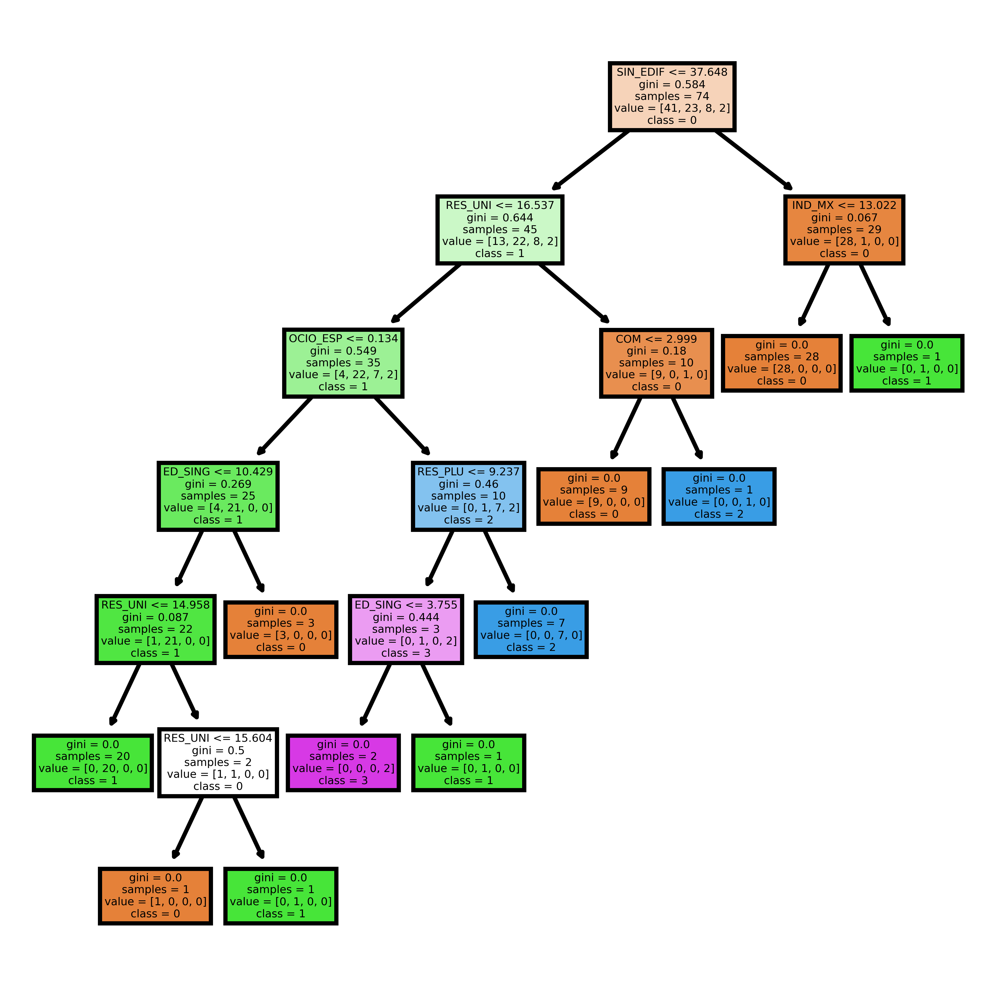

In [235]:
plt.figure(figsize =(4,4), dpi =1000)
plot_tree(full_tree, feature_names = feature_names, class_names = class_names, filled = True)

[Text(0.6833333333333333, 0.9285714285714286, 'SIN_EDIF <= 37.648\ngini = 0.584\nsamples = 74\nvalue = [41, 23, 8, 2]\nclass = 0'),
 Text(0.5, 0.7857142857142857, 'RES_UNI <= 16.537\ngini = 0.644\nsamples = 45\nvalue = [13, 22, 8, 2]\nclass = 1'),
 Text(0.3333333333333333, 0.6428571428571429, 'OCIO_ESP <= 0.134\ngini = 0.549\nsamples = 35\nvalue = [4, 22, 7, 2]\nclass = 1'),
 Text(0.2, 0.5, 'ED_SING <= 10.429\ngini = 0.269\nsamples = 25\nvalue = [4, 21, 0, 0]\nclass = 1'),
 Text(0.13333333333333333, 0.35714285714285715, 'RES_UNI <= 14.958\ngini = 0.087\nsamples = 22\nvalue = [1, 21, 0, 0]\nclass = 1'),
 Text(0.06666666666666667, 0.21428571428571427, 'gini = 0.0\nsamples = 20\nvalue = [0, 20, 0, 0]\nclass = 1'),
 Text(0.2, 0.21428571428571427, 'RES_UNI <= 15.604\ngini = 0.5\nsamples = 2\nvalue = [1, 1, 0, 0]\nclass = 0'),
 Text(0.13333333333333333, 0.07142857142857142, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]\nclass = 0'),
 Text(0.26666666666666666, 0.07142857142857142, 'gini = 0.

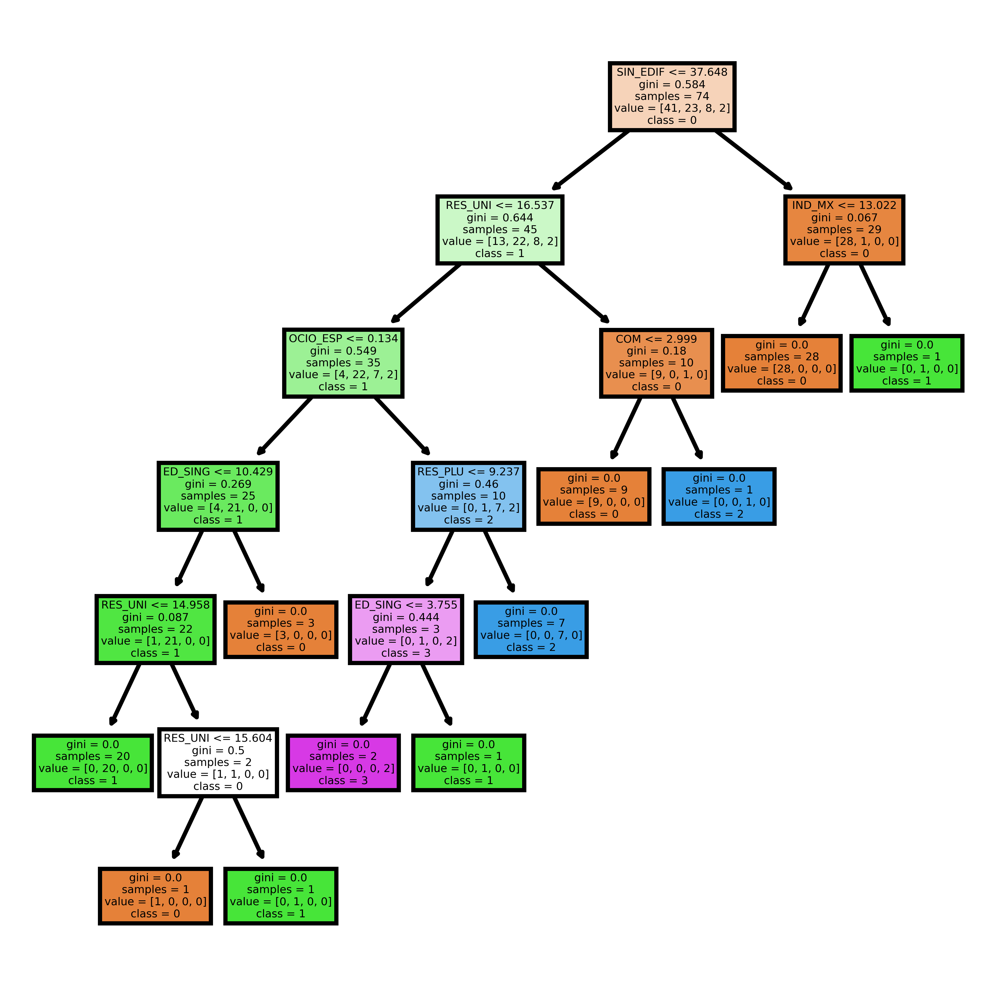

In [234]:
plt.figure(figsize =(4,4), dpi =1000)
plot_tree(full_tree_mm, feature_names = feature_names, class_names = class_names, filled = True)

[Text(0.6833333333333333, 0.9285714285714286, 'SIN_EDIF <= 37.648\ngini = 0.584\nsamples = 74\nvalue = [41, 23, 8, 2]\nclass = 0'),
 Text(0.5, 0.7857142857142857, 'RES_UNI <= 16.537\ngini = 0.644\nsamples = 45\nvalue = [13, 22, 8, 2]\nclass = 1'),
 Text(0.3333333333333333, 0.6428571428571429, 'OCIO_ESP <= 0.134\ngini = 0.549\nsamples = 35\nvalue = [4, 22, 7, 2]\nclass = 1'),
 Text(0.2, 0.5, 'ED_SING <= 10.429\ngini = 0.269\nsamples = 25\nvalue = [4, 21, 0, 0]\nclass = 1'),
 Text(0.13333333333333333, 0.35714285714285715, 'RES_UNI <= 14.958\ngini = 0.087\nsamples = 22\nvalue = [1, 21, 0, 0]\nclass = 1'),
 Text(0.06666666666666667, 0.21428571428571427, 'gini = 0.0\nsamples = 20\nvalue = [0, 20, 0, 0]\nclass = 1'),
 Text(0.2, 0.21428571428571427, 'RES_UNI <= 15.604\ngini = 0.5\nsamples = 2\nvalue = [1, 1, 0, 0]\nclass = 0'),
 Text(0.13333333333333333, 0.07142857142857142, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]\nclass = 0'),
 Text(0.26666666666666666, 0.07142857142857142, 'gini = 0.

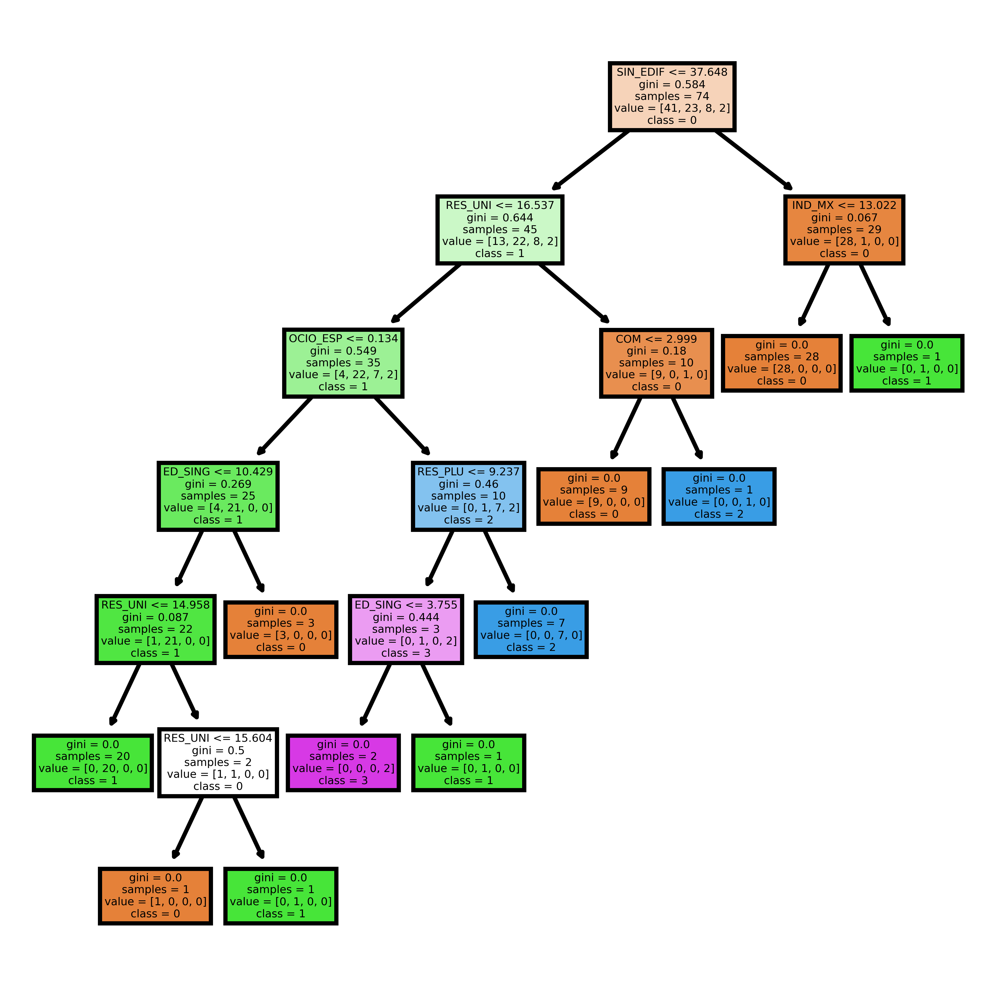

In [232]:
plt.figure(figsize =(4,4), dpi =1000)
plot_tree(full_tree_tsne, feature_names = feature_names, class_names = class_names, filled = True)

In [211]:
print(classification_report(labels, full_tree.predict(features)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        41
           1       1.00      1.00      1.00        23
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00         2

    accuracy                           1.00        74
   macro avg       1.00      1.00      1.00        74
weighted avg       1.00      1.00      1.00        74



In [212]:
Importance = full_tree.feature_importances_

In [213]:
pd.DataFrame({'features':feature_names, 'Importance':Importance})

,features,Importance
0,COM,0.041651
1,ED_SING,0.142174
2,EQUIP_EDU,0.000000
3,EQUIP_OTR,0.000000
4,EQUIP_SANI,0.000000
5,HOS_REST,0.000000
6,IND,0.000000
7,IND_MX,0.044683
8,OCIO_ESP,0.182339
9,OFI,0.000000


1.- Si hago el cluster con los datos originales, luego ejecuto el arbol de decision puedo sacar una idea de la importancia relativa solo en base a los datos originales ##

2.- Esto lo puedo complementar nuevamente con un random forest, para tener la idea de muchos arboles. Sin embargo, no puedo ajustar los parametros en base a las predicciones si no tengo un conjunto de test. 

In [ ]:
usos_wide['Agcluster']